#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [39]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [40]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_logits"
models_saves = "model_saves"

In [41]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [42]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [43]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [44]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 400])

In [45]:
emb

tensor([[0.0000, 0.5059, 0.4684,  ..., 1.4475, 0.0000, 0.0000],
        [0.8335, 0.0000, 0.7738,  ..., 0.0000, 0.2971, 0.0000],
        [2.1824, 0.4088, 0.0000,  ..., 0.3287, 0.0000, 1.3125],
        ...,
        [0.0000, 0.1891, 1.1394,  ..., 0.0000, 1.2422, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.1837, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.5454,  ..., 0.0000, 0.0000, 1.1542]],
       grad_fn=<ReluBackward0>)

---

In [46]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [47]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [48]:
dataReader.data.shape

(124,)

In [49]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [50]:
dts = PAMAP2Dataset

In [51]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_400.npz')
video_classes, video_feat = video_data['activity'], video_data['features']

In [52]:
video_feat.shape

(180, 400)

In [53]:
np.unique(video_classes, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [54]:
vid_cls_name = np.unique(video_classes)

In [55]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [56]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 400])

In [57]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [58]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [59]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [60]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [61]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [62]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [63]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [64]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [65]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [66]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [67]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [68]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 400])

In [69]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes,1),selected_features)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [70]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [71]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [72]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 261/261 [00:22<00:00, 11.56batch/s, loss=109, accuracy=0.875]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 22.08batch/s, loss=110]


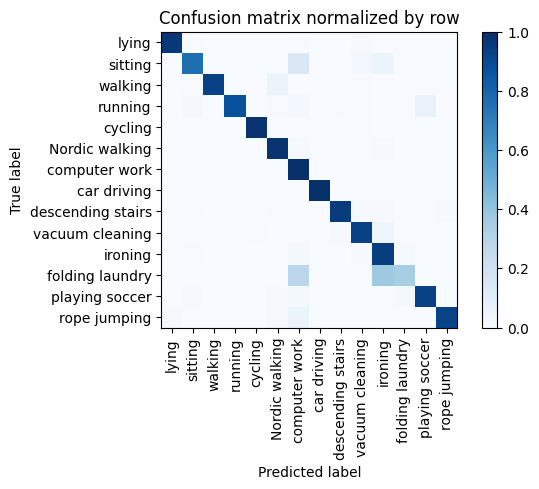

Training Epoch:   7%|▋         | 1/15 [00:25<06:02, 25.86s/it]

Overall accuracy: 0.909

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.814      0.994      0.895      0.148        617|	 vacuum cleaning: 0.003,	folding laundry: 0.002,	
          ironing       0.778      0.947      0.854      0.113        469|	 computer work: 0.021,	folding laundry: 0.015,	
          walking       1.000      0.932      0.965      0.109        455|	 Nordic walking: 0.053,	vacuum cleaning: 0.007,	
            lying       0.994      0.967      0.981      0.088        367|	 vacuum cleaning: 0.008,	computer work: 0.005,	
          sitting       0.952      0.760      0.845      0.087        362|	 computer work: 0.146,	ironing: 0.061,	
  vacuum cleaning       0.923      0.934      0.928      0.087        361|	 ironing: 0.050,	descending stairs: 0.008,	
   Nordic walking       0.923      0.977      0.949      0.083        346|	 ironing: 0.012,	computer work: 0.012,	
          cycling       0.994      0.9


train: 100%|██████████| 261/261 [00:24<00:00, 10.71batch/s, loss=111, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 21.22batch/s, loss=105]


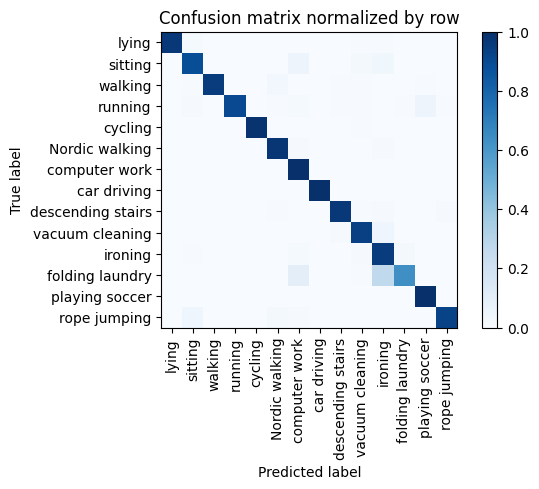

Training Epoch:  13%|█▎        | 2/15 [00:53<05:50, 26.97s/it]

Overall accuracy: 0.941

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.919      0.995      0.955      0.147        612|	 folding laundry: 0.002,	ironing: 0.002,	
          ironing       0.823      0.953      0.883      0.113        469|	 folding laundry: 0.017,	computer work: 0.013,	
          walking       1.000      0.951      0.975      0.108        450|	 Nordic walking: 0.029,	vacuum cleaning: 0.007,	
            lying       1.000      0.968      0.984      0.089        371|	 sitting: 0.013,	ironing: 0.005,	
  vacuum cleaning       0.937      0.937      0.937      0.087        364|	 ironing: 0.047,	descending stairs: 0.011,	
          sitting       0.944      0.886      0.914      0.087        361|	 computer work: 0.050,	ironing: 0.039,	
   Nordic walking       0.952      0.974      0.963      0.084        349|	 ironing: 0.011,	computer work: 0.011,	
          cycling       0.997      0.987      0.992      0.0


train: 100%|██████████| 261/261 [00:24<00:00, 10.63batch/s, loss=111, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 21.51batch/s, loss=109]


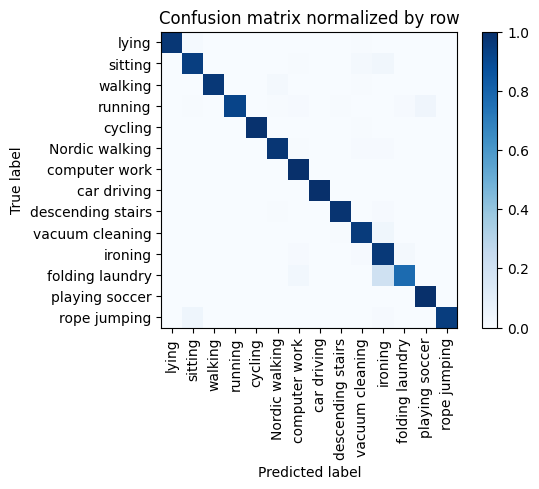

Training Epoch:  20%|██        | 3/15 [01:21<05:28, 27.39s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.973      0.997      0.985      0.148        614|	 folding laundry: 0.002,	sitting: 0.002,	
          ironing       0.859      0.962      0.908      0.113        470|	 folding laundry: 0.017,	vacuum cleaning: 0.011,	
          walking       1.000      0.967      0.983      0.109        452|	 Nordic walking: 0.018,	vacuum cleaning: 0.007,	
            lying       1.000      0.970      0.985      0.089        369|	 sitting: 0.014,	vacuum cleaning: 0.005,	
          sitting       0.961      0.943      0.952      0.088        366|	 ironing: 0.033,	vacuum cleaning: 0.019,	
  vacuum cleaning       0.940      0.956      0.948      0.087        363|	 ironing: 0.036,	descending stairs: 0.006,	
   Nordic walking       0.972      0.974      0.973      0.084        350|	 ironing: 0.009,	vacuum cleaning: 0.009,	
          cycling       0.997      0.990      


train: 100%|██████████| 261/261 [00:24<00:00, 10.64batch/s, loss=108, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.53batch/s, loss=108]


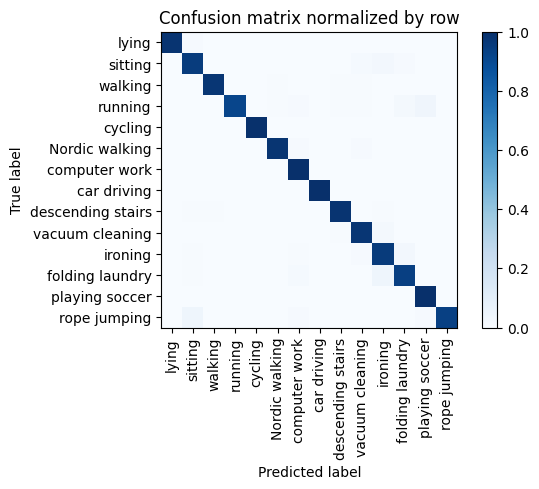

Training Epoch:  27%|██▋       | 4/15 [01:49<05:05, 27.78s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.997      0.988      0.147        610|	 folding laundry: 0.002,	sitting: 0.002,	
          ironing       0.947      0.955      0.951      0.113        470|	 folding laundry: 0.026,	vacuum cleaning: 0.009,	
          walking       0.998      0.976      0.986      0.108        449|	 vacuum cleaning: 0.007,	descending stairs: 0.007,	
            lying       1.000      0.981      0.990      0.089        371|	 sitting: 0.011,	rope jumping: 0.003,	
          sitting       0.954      0.951      0.952      0.088        367|	 ironing: 0.025,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.954      0.975      0.965      0.087        363|	 ironing: 0.017,	descending stairs: 0.006,	
   Nordic walking       0.988      0.977      0.983      0.084        348|	 vacuum cleaning: 0.011,	computer work: 0.009,	
          cycling       1.000      0.994


train: 100%|██████████| 261/261 [00:24<00:00, 10.50batch/s, loss=114, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.81batch/s, loss=108]


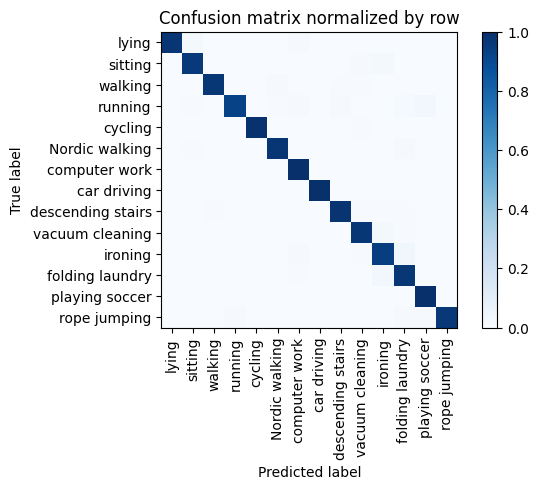

Training Epoch:  33%|███▎      | 5/15 [02:18<04:39, 27.97s/it]

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.998      0.989      0.148        617|	 sitting: 0.002,	rope jumping: 0.000,	
          ironing       0.955      0.944      0.950      0.113        468|	 folding laundry: 0.038,	computer work: 0.011,	
          walking       0.998      0.971      0.984      0.108        449|	 Nordic walking: 0.011,	vacuum cleaning: 0.007,	
            lying       1.000      0.973      0.986      0.089        370|	 sitting: 0.016,	computer work: 0.008,	
          sitting       0.964      0.964      0.964      0.087        364|	 ironing: 0.019,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.962      0.970      0.966      0.087        361|	 ironing: 0.019,	folding laundry: 0.006,	
   Nordic walking       0.983      0.974      0.978      0.084        349|	 folding laundry: 0.009,	sitting: 0.006,	
          cycling       0.997      0.991      0.994    


train: 100%|██████████| 261/261 [00:24<00:00, 10.64batch/s, loss=108, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.92batch/s, loss=103]


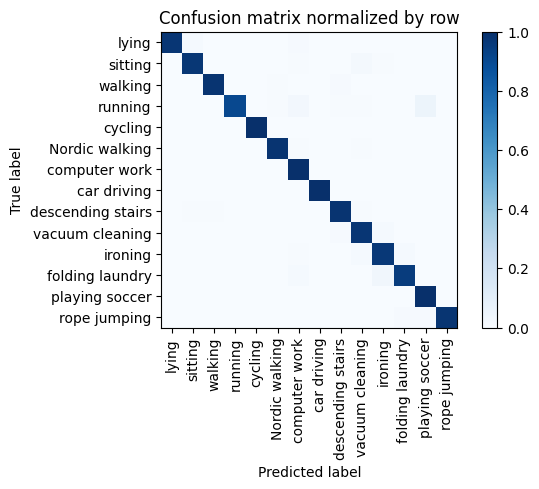

Training Epoch:  40%|████      | 6/15 [02:46<04:12, 28.02s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.971      0.998      0.985      0.147        611|	 sitting: 0.002,	rope jumping: 0.000,	
          ironing       0.968      0.966      0.967      0.113        471|	 folding laundry: 0.013,	vacuum cleaning: 0.013,	
          walking       0.998      0.982      0.990      0.108        451|	 descending stairs: 0.011,	Nordic walking: 0.004,	
            lying       1.000      0.976      0.988      0.089        370|	 sitting: 0.014,	computer work: 0.008,	
          sitting       0.975      0.973      0.974      0.087        364|	 vacuum cleaning: 0.016,	ironing: 0.005,	
  vacuum cleaning       0.957      0.975      0.966      0.087        362|	 ironing: 0.014,	descending stairs: 0.008,	
   Nordic walking       0.991      0.983      0.987      0.084        349|	 vacuum cleaning: 0.006,	computer work: 0.006,	
          cycling       1.000      0.997   


train: 100%|██████████| 261/261 [00:25<00:00, 10.40batch/s, loss=106, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.39batch/s, loss=102]


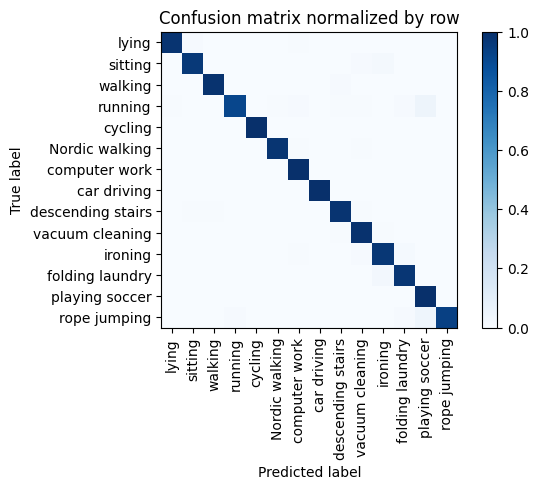

Training Epoch:  47%|████▋     | 7/15 [03:14<03:45, 28.22s/it]

Overall accuracy: 0.980

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.984      0.998      0.991      0.147        613|	 sitting: 0.002,	rope jumping: 0.000,	
          ironing       0.972      0.970      0.971      0.113        469|	 folding laundry: 0.013,	vacuum cleaning: 0.009,	
          walking       0.996      0.985      0.990      0.109        454|	 descending stairs: 0.011,	vacuum cleaning: 0.002,	
            lying       0.994      0.981      0.988      0.088        368|	 sitting: 0.008,	computer work: 0.005,	
          sitting       0.981      0.964      0.972      0.088        365|	 ironing: 0.016,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.962      0.989      0.975      0.087        361|	 ironing: 0.006,	descending stairs: 0.006,	
   Nordic walking       0.994      0.980      0.987      0.084        349|	 vacuum cleaning: 0.006,	computer work: 0.006,	
          cycling       1.000      0.997  


train: 100%|██████████| 261/261 [00:25<00:00, 10.44batch/s, loss=107, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.49batch/s, loss=108]


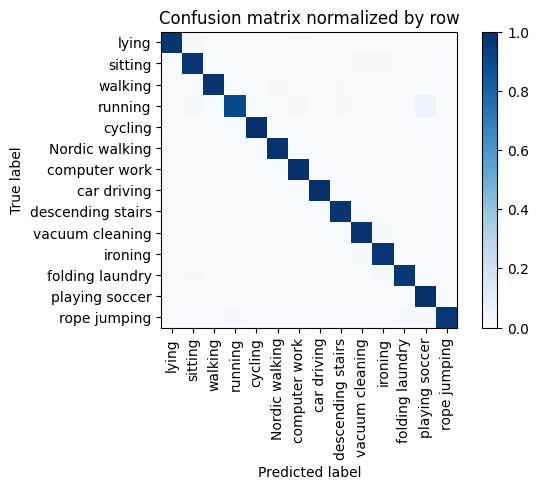

Training Epoch:  53%|█████▎    | 8/15 [03:43<03:18, 28.31s/it]

Overall accuracy: 0.980

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.984      0.998      0.991      0.148        616|	 sitting: 0.002,	rope jumping: 0.000,	
          ironing       0.979      0.972      0.975      0.113        469|	 vacuum cleaning: 0.011,	folding laundry: 0.006,	
          walking       0.998      0.978      0.988      0.109        453|	 descending stairs: 0.011,	Nordic walking: 0.009,	
            lying       1.000      0.978      0.989      0.088        367|	 sitting: 0.016,	computer work: 0.005,	
          sitting       0.954      0.975      0.965      0.088        365|	 vacuum cleaning: 0.011,	ironing: 0.008,	
  vacuum cleaning       0.970      0.978      0.974      0.087        364|	 ironing: 0.011,	descending stairs: 0.005,	
   Nordic walking       0.983      0.988      0.986      0.083        346|	 sitting: 0.006,	folding laundry: 0.003,	
          cycling       0.997      0.997      0.9


train: 100%|██████████| 261/261 [00:25<00:00, 10.11batch/s, loss=102, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.74batch/s, loss=105]


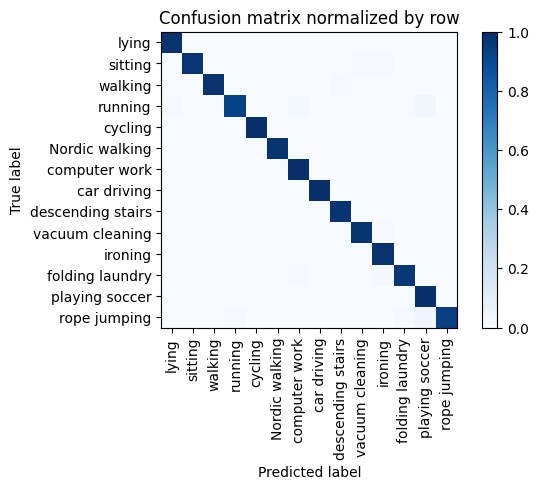

Training Epoch:  60%|██████    | 9/15 [04:12<02:51, 28.67s/it]

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.982      1.000      0.991      0.148        615|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.979      0.985      0.982      0.112        466|	 vacuum cleaning: 0.006,	folding laundry: 0.004,	
          walking       0.998      0.987      0.992      0.109        452|	 descending stairs: 0.009,	Nordic walking: 0.002,	
            lying       0.992      0.986      0.989      0.088        368|	 computer work: 0.005,	sitting: 0.005,	
          sitting       0.981      0.973      0.977      0.088        366|	 ironing: 0.008,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.983      0.981      0.982      0.087        361|	 ironing: 0.008,	descending stairs: 0.006,	
   Nordic walking       0.991      0.983      0.987      0.083        347|	 cycling: 0.006,	sitting: 0.006,	
          cycling       0.987      0.997      0.99


train: 100%|██████████| 261/261 [00:25<00:00, 10.24batch/s, loss=106, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.54batch/s, loss=106]


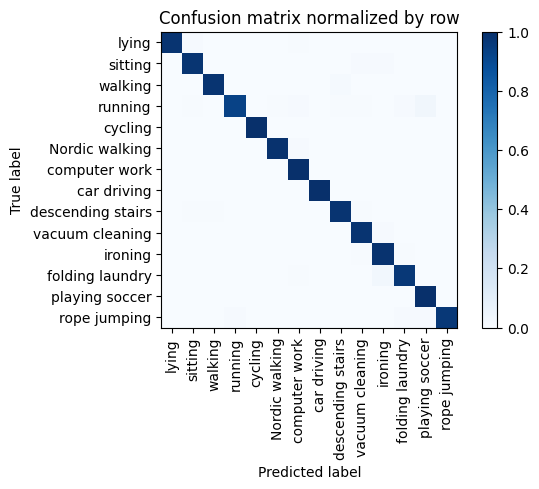

Training Epoch:  67%|██████▋   | 10/15 [04:42<02:24, 28.84s/it]

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      1.000      0.993      0.147        612|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.971      0.985      0.978      0.113        470|	 vacuum cleaning: 0.006,	folding laundry: 0.004,	
          walking       0.998      0.982      0.990      0.108        450|	 descending stairs: 0.013,	Nordic walking: 0.002,	
            lying       1.000      0.984      0.992      0.089        370|	 sitting: 0.008,	computer work: 0.005,	
          sitting       0.978      0.978      0.978      0.087        364|	 ironing: 0.008,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.978      0.983      0.981      0.087        362|	 ironing: 0.011,	Nordic walking: 0.003,	
   Nordic walking       0.991      0.988      0.990      0.083        347|	 computer work: 0.009,	sitting: 0.003,	
          cycling       0.997      0.997      0


train: 100%|██████████| 261/261 [00:25<00:00, 10.23batch/s, loss=104, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.37batch/s, loss=101]


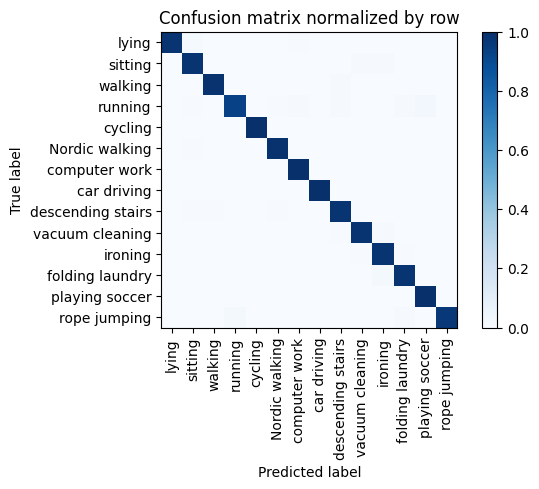

Training Epoch:  73%|███████▎  | 11/15 [05:11<01:55, 28.90s/it]

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      1.000      0.994      0.147        613|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.979      0.983      0.981      0.113        469|	 folding laundry: 0.006,	vacuum cleaning: 0.004,	
          walking       0.998      0.985      0.991      0.109        452|	 descending stairs: 0.011,	Nordic walking: 0.002,	
            lying       1.000      0.981      0.990      0.088        368|	 sitting: 0.014,	computer work: 0.005,	
          sitting       0.967      0.978      0.973      0.088        365|	 vacuum cleaning: 0.011,	ironing: 0.008,	
  vacuum cleaning       0.983      0.981      0.982      0.087        362|	 ironing: 0.008,	descending stairs: 0.006,	
   Nordic walking       0.989      0.989      0.989      0.084        349|	 sitting: 0.006,	folding laundry: 0.003,	
          cycling       0.997      0.997  


train: 100%|██████████| 261/261 [00:25<00:00, 10.38batch/s, loss=109, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.40batch/s, loss=104]


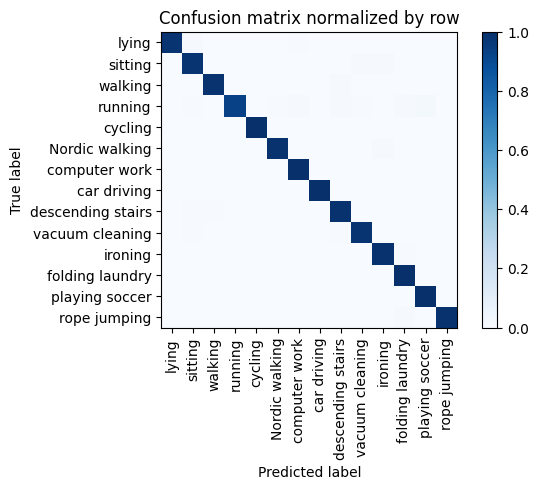

Training Epoch:  80%|████████  | 12/15 [05:39<01:26, 28.82s/it]

Overall accuracy: 0.988

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      1.000      0.996      0.148        614|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.985      0.989      0.987      0.113        470|	 folding laundry: 0.004,	vacuum cleaning: 0.002,	
          walking       0.998      0.987      0.992      0.109        453|	 descending stairs: 0.009,	Nordic walking: 0.002,	
            lying       0.997      0.984      0.990      0.088        368|	 sitting: 0.008,	computer work: 0.005,	
          sitting       0.978      0.978      0.978      0.087        364|	 ironing: 0.008,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.986      0.983      0.985      0.087        360|	 descending stairs: 0.006,	sitting: 0.006,	
   Nordic walking       0.991      0.989      0.990      0.084        348|	 ironing: 0.009,	folding laundry: 0.003,	
          cycling       0.997      1.000  


train: 100%|██████████| 261/261 [00:26<00:00,  9.93batch/s, loss=100, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.11batch/s, loss=105]


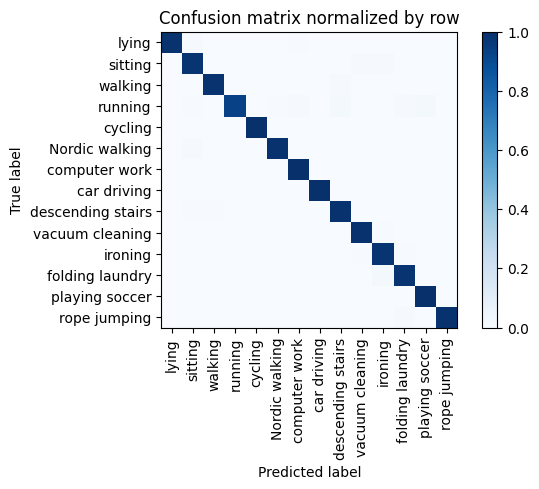

Training Epoch:  87%|████████▋ | 13/15 [06:09<00:58, 29.13s/it]

Overall accuracy: 0.987

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.998      0.996      0.148        616|	 sitting: 0.002,	rope jumping: 0.000,	
          ironing       0.981      0.983      0.982      0.113        468|	 folding laundry: 0.006,	vacuum cleaning: 0.006,	
          walking       0.998      0.987      0.992      0.109        452|	 descending stairs: 0.009,	Nordic walking: 0.002,	
            lying       1.000      0.986      0.993      0.088        368|	 sitting: 0.008,	computer work: 0.005,	
          sitting       0.968      0.981      0.974      0.088        366|	 vacuum cleaning: 0.011,	ironing: 0.008,	
  vacuum cleaning       0.981      0.989      0.985      0.087        363|	 ironing: 0.006,	Nordic walking: 0.003,	
   Nordic walking       0.991      0.988      0.990      0.083        347|	 sitting: 0.009,	folding laundry: 0.003,	
          cycling       0.997      0.997      0.997 


train: 100%|██████████| 261/261 [00:25<00:00, 10.31batch/s, loss=99.9, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.51batch/s, loss=102]


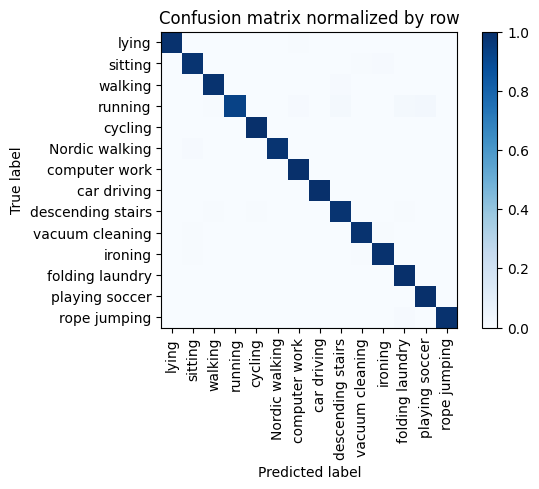

Training Epoch:  93%|█████████▎| 14/15 [06:38<00:29, 29.08s/it]

Overall accuracy: 0.988

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      1.000      0.996      0.148        614|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.985      0.989      0.987      0.113        471|	 vacuum cleaning: 0.004,	sitting: 0.004,	
          walking       0.996      0.987      0.991      0.108        450|	 descending stairs: 0.009,	Nordic walking: 0.002,	
            lying       0.997      0.992      0.995      0.088        367|	 computer work: 0.005,	sitting: 0.003,	
          sitting       0.978      0.981      0.979      0.088        365|	 ironing: 0.008,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.989      0.986      0.988      0.087        361|	 ironing: 0.006,	sitting: 0.006,	
   Nordic walking       0.994      0.983      0.988      0.083        346|	 sitting: 0.009,	folding laundry: 0.003,	
          cycling       0.991      0.997      0.994      0.0


train: 100%|██████████| 261/261 [00:25<00:00, 10.04batch/s, loss=105, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.75batch/s, loss=106]


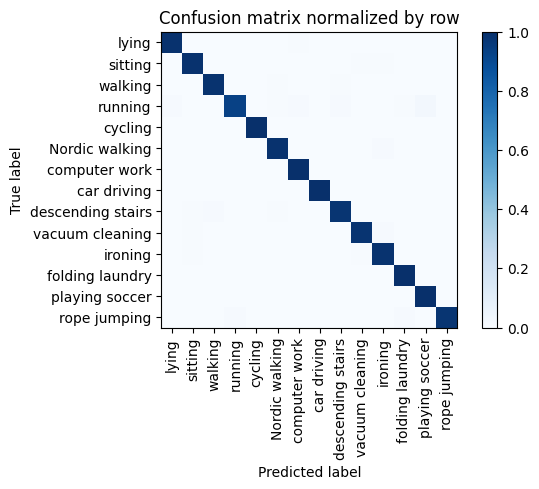

Overall accuracy: 0.988

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      1.000      0.996      0.147        613|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.983      0.987      0.985      0.112        466|	 vacuum cleaning: 0.004,	sitting: 0.004,	
          walking       0.996      0.984      0.990      0.108        451|	 descending stairs: 0.007,	Nordic walking: 0.007,	
            lying       0.995      0.989      0.992      0.089        370|	 computer work: 0.005,	rope jumping: 0.003,	
          sitting       0.984      0.989      0.986      0.088        366|	 ironing: 0.005,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.989      0.981      0.985      0.087        362|	 ironing: 0.008,	sitting: 0.006,	
   Nordic walking       0.983      0.989      0.986      0.084        349|	 ironing: 0.009,	computer work: 0.003,	
          cycling       0.997      0.997      0.997      

unseen: 100%|██████████| 87/87 [00:04<00:00, 20.99batch/s, loss=109]


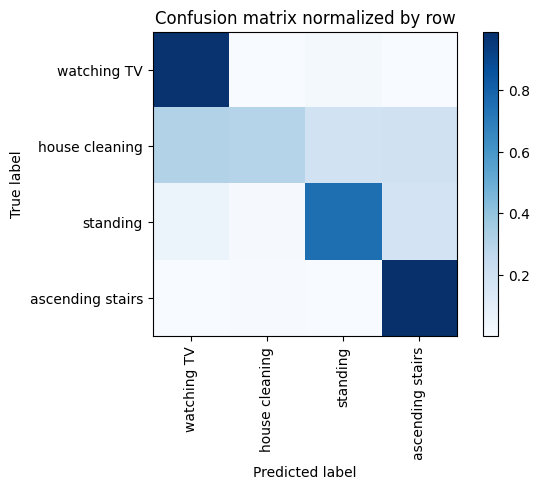

Overall accuracy: 0.683

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.788      0.753      0.770      0.331       1843|	 ascending stairs: 0.181,	watching TV: 0.054,	
  house cleaning       0.947      0.302      0.458      0.329       1831|	 watching TV: 0.307,	ascending stairs: 0.197,	
ascending stairs       0.603      0.990      0.750      0.192       1071|	 house cleaning: 0.006,	standing: 0.004,	
     watching TV       0.548      0.976      0.702      0.148        823|	 standing: 0.017,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.769      0.683      0.653        1.0       5568|	      

{'accuracy': 0.6831896551724138, 'precision': 0.721539098915074, 'recall': 0.7551421388303414, 'f1': 0.6698722765026651}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting', 'desc

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 262/262 [00:25<00:00, 10.25batch/s, loss=107, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.22batch/s, loss=107]


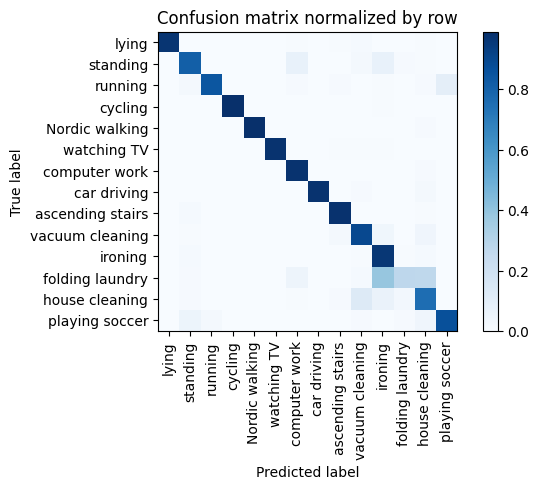

Training Epoch:   7%|▋         | 1/15 [00:29<06:50, 29.29s/it]

Overall accuracy: 0.893

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.925      0.978      0.951      0.140        582|	 house cleaning: 0.010,	ironing: 0.003,	
         ironing       0.745      0.961      0.839      0.110        458|	 house cleaning: 0.015,	standing: 0.013,	
           lying       1.000      0.968      0.983      0.096        400|	 vacuum cleaning: 0.013,	computer work: 0.007,	
        standing       0.920      0.812      0.863      0.095        394|	 ironing: 0.076,	computer work: 0.074,	
  house cleaning       0.733      0.758      0.745      0.085        355|	 vacuum cleaning: 0.124,	ironing: 0.062,	
  Nordic walking       1.000      0.989      0.994      0.085        352|	 house cleaning: 0.009,	ironing: 0.003,	
 vacuum cleaning       0.810      0.896      0.851      0.079        328|	 house cleaning: 0.040,	ironing: 0.037,	
         cycling       0.994      0.990      0.992      0.075        3


train: 100%|██████████| 262/262 [00:26<00:00, 10.01batch/s, loss=107, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.82batch/s, loss=105]


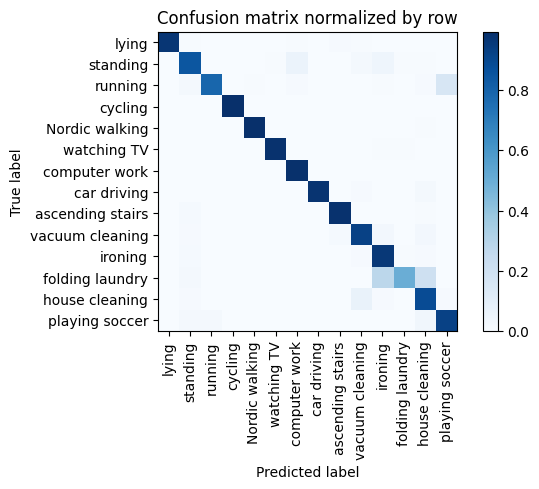

Training Epoch:  13%|█▎        | 2/15 [00:59<06:24, 29.59s/it]

Overall accuracy: 0.921

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.949      0.988      0.968      0.139        578|	 house cleaning: 0.003,	standing: 0.003,	
         ironing       0.826      0.960      0.888      0.109        455|	 standing: 0.015,	house cleaning: 0.009,	
           lying       1.000      0.967      0.983      0.095        397|	 ascending stairs: 0.010,	computer work: 0.008,	
        standing       0.913      0.850      0.880      0.094        393|	 computer work: 0.061,	ironing: 0.043,	
  house cleaning       0.822      0.888      0.854      0.086        358|	 vacuum cleaning: 0.070,	ironing: 0.011,	
  Nordic walking       0.997      0.992      0.994      0.085        353|	 house cleaning: 0.006,	ironing: 0.003,	
 vacuum cleaning       0.879      0.924      0.901      0.079        330|	 house cleaning: 0.024,	ironing: 0.024,	
         cycling       1.000      0.994      0.997      0.076       


train: 100%|██████████| 262/262 [00:32<00:00,  8.10batch/s, loss=105, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.36batch/s, loss=105]


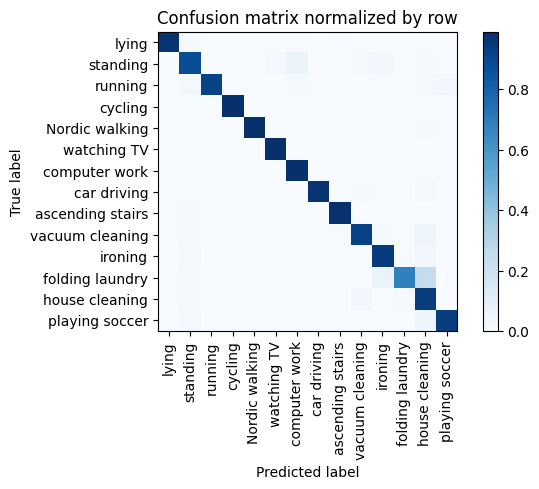

Training Epoch:  20%|██        | 3/15 [01:35<06:33, 32.81s/it]

Overall accuracy: 0.942

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.949      0.988      0.968      0.140        582|	 house cleaning: 0.007,	folding laundry: 0.002,	
         ironing       0.929      0.948      0.938      0.110        458|	 house cleaning: 0.024,	standing: 0.017,	
           lying       1.000      0.968      0.983      0.096        400|	 standing: 0.010,	computer work: 0.007,	
        standing       0.916      0.878      0.897      0.095        395|	 computer work: 0.061,	ironing: 0.028,	
  house cleaning       0.769      0.943      0.847      0.085        352|	 vacuum cleaning: 0.028,	standing: 0.011,	
  Nordic walking       0.997      0.989      0.993      0.085        352|	 house cleaning: 0.011,	playing soccer: 0.000,	
 vacuum cleaning       0.941      0.920      0.930      0.079        327|	 house cleaning: 0.049,	ironing: 0.015,	
         cycling       1.000      0.991      0.995      0.076


train: 100%|██████████| 262/262 [00:29<00:00,  8.81batch/s, loss=106, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.97batch/s, loss=104]


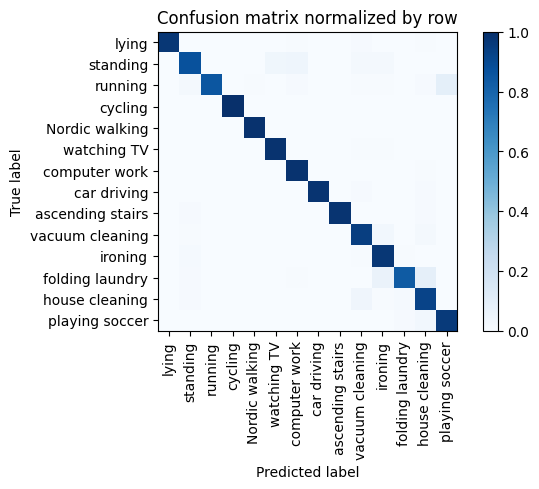

Training Epoch:  27%|██▋       | 4/15 [02:09<06:03, 33.02s/it]

Overall accuracy: 0.951

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.960      0.988      0.974      0.140        583|	 house cleaning: 0.005,	folding laundry: 0.003,	
         ironing       0.927      0.971      0.949      0.110        456|	 standing: 0.013,	folding laundry: 0.007,	
           lying       1.000      0.972      0.986      0.095        394|	 vacuum cleaning: 0.010,	computer work: 0.008,	
        standing       0.940      0.873      0.905      0.094        393|	 computer work: 0.043,	watching TV: 0.038,	
  Nordic walking       0.997      0.992      0.994      0.085        354|	 house cleaning: 0.003,	folding laundry: 0.003,	
  house cleaning       0.891      0.924      0.907      0.085        353|	 vacuum cleaning: 0.042,	folding laundry: 0.014,	
 vacuum cleaning       0.901      0.942      0.921      0.079        329|	 ironing: 0.030,	house cleaning: 0.018,	
         cycling       1.000      1.000  


train: 100%|██████████| 262/262 [00:27<00:00,  9.37batch/s, loss=101, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 20.12batch/s, loss=106]


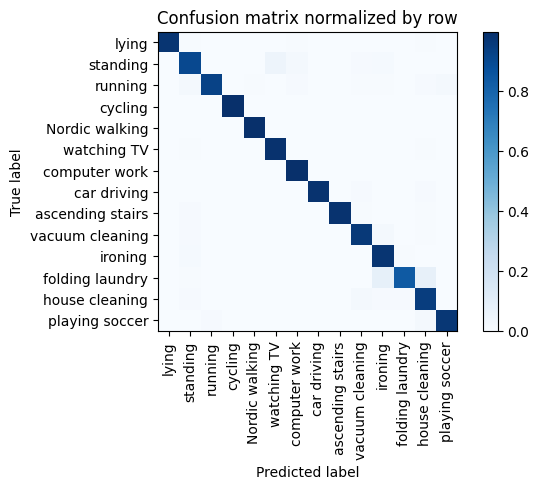

Training Epoch:  33%|███▎      | 5/15 [02:40<05:25, 32.56s/it]

Overall accuracy: 0.962

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.975      0.995      0.985      0.139        579|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.926      0.976      0.950      0.110        459|	 standing: 0.015,	folding laundry: 0.004,	
           lying       1.000      0.977      0.989      0.095        397|	 computer work: 0.008,	house cleaning: 0.005,	
        standing       0.937      0.902      0.919      0.095        396|	 watching TV: 0.048,	computer work: 0.023,	
  Nordic walking       0.997      0.994      0.996      0.085        354|	 house cleaning: 0.003,	standing: 0.003,	
  house cleaning       0.915      0.943      0.929      0.085        353|	 vacuum cleaning: 0.023,	ironing: 0.011,	
 vacuum cleaning       0.948      0.960      0.954      0.078        326|	 ironing: 0.021,	standing: 0.009,	
         cycling       1.000      0.997      0.998      0.076  


train: 100%|██████████| 262/262 [00:27<00:00,  9.39batch/s, loss=106, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.81batch/s, loss=101]


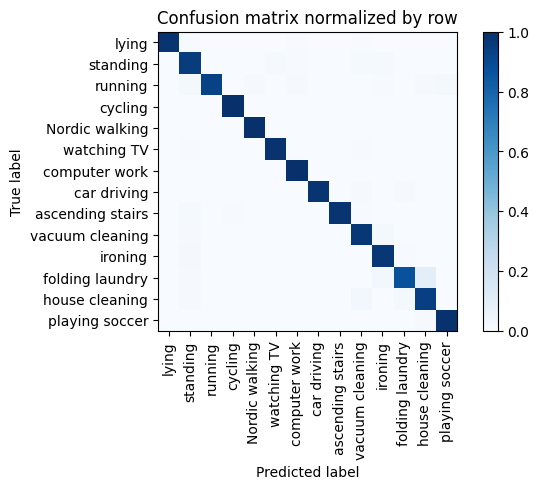

Training Epoch:  40%|████      | 6/15 [03:12<04:49, 32.22s/it]

Overall accuracy: 0.969

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.997      0.992      0.140        581|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.959      0.971      0.965      0.110        456|	 standing: 0.018,	folding laundry: 0.007,	
           lying       1.000      0.977      0.989      0.095        397|	 computer work: 0.008,	vacuum cleaning: 0.005,	
        standing       0.932      0.951      0.942      0.094        390|	 ironing: 0.015,	vacuum cleaning: 0.013,	
  house cleaning       0.925      0.938      0.932      0.086        356|	 vacuum cleaning: 0.028,	folding laundry: 0.017,	
  Nordic walking       0.994      0.997      0.996      0.085        354|	 standing: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.938      0.970      0.954      0.079        328|	 ironing: 0.018,	standing: 0.009,	
         cycling       0.997      1.000      0.998      


train: 100%|██████████| 262/262 [00:33<00:00,  7.89batch/s, loss=102, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.99batch/s, loss=103]


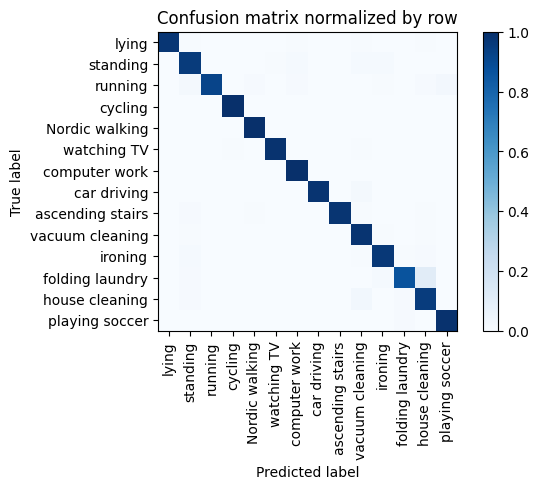

Training Epoch:  47%|████▋     | 7/15 [03:50<04:32, 34.09s/it]

Overall accuracy: 0.971

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.983      0.997      0.990      0.139        577|	 house cleaning: 0.003,	playing soccer: 0.000,	
         ironing       0.976      0.967      0.971      0.110        457|	 standing: 0.015,	house cleaning: 0.009,	
           lying       1.000      0.975      0.987      0.096        400|	 computer work: 0.007,	house cleaning: 0.005,	
        standing       0.947      0.954      0.951      0.094        393|	 vacuum cleaning: 0.015,	ironing: 0.013,	
  house cleaning       0.904      0.952      0.927      0.085        355|	 vacuum cleaning: 0.028,	folding laundry: 0.008,	
  Nordic walking       0.992      0.997      0.994      0.085        353|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.928      0.982      0.954      0.078        326|	 house cleaning: 0.006,	ironing: 0.006,	
         cycling       0.997      1.000      0


train: 100%|██████████| 262/262 [00:33<00:00,  7.79batch/s, loss=105, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.43batch/s, loss=99.9]


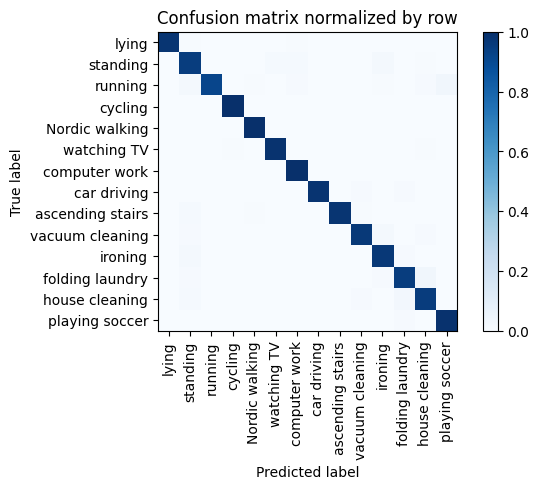

Training Epoch:  53%|█████▎    | 8/15 [04:28<04:07, 35.41s/it]

Overall accuracy: 0.972

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.981      0.997      0.989      0.139        580|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.963      0.965      0.964      0.110        457|	 standing: 0.018,	folding laundry: 0.011,	
           lying       1.000      0.977      0.989      0.095        396|	 computer work: 0.008,	standing: 0.008,	
        standing       0.930      0.947      0.938      0.094        393|	 ironing: 0.020,	watching TV: 0.015,	
  house cleaning       0.950      0.950      0.950      0.086        357|	 folding laundry: 0.025,	standing: 0.014,	
  Nordic walking       0.994      0.997      0.996      0.085        354|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.976      0.964      0.970      0.080        331|	 ironing: 0.018,	house cleaning: 0.009,	
         cycling       0.997      1.000      0.998      0.075


train: 100%|██████████| 262/262 [00:34<00:00,  7.68batch/s, loss=99.2, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.92batch/s, loss=103]


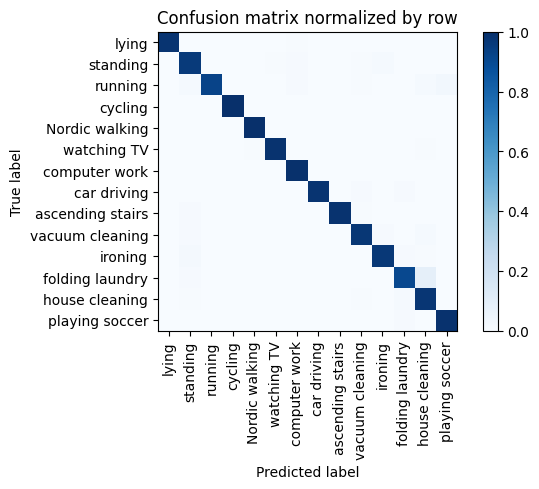

Training Epoch:  60%|██████    | 9/15 [05:07<03:38, 36.40s/it]

Overall accuracy: 0.975

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.985      0.995      0.990      0.139        578|	 house cleaning: 0.003,	lying: 0.002,	
         ironing       0.982      0.967      0.975      0.109        455|	 standing: 0.018,	folding laundry: 0.009,	
           lying       0.997      0.983      0.990      0.096        400|	 computer work: 0.007,	house cleaning: 0.003,	
        standing       0.947      0.959      0.953      0.094        393|	 ironing: 0.013,	computer work: 0.010,	
  house cleaning       0.915      0.975      0.944      0.085        354|	 folding laundry: 0.014,	vacuum cleaning: 0.006,	
  Nordic walking       0.997      0.997      0.997      0.085        354|	 ascending stairs: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.970      0.970      0.970      0.079        328|	 house cleaning: 0.012,	ironing: 0.009,	
         cycling       1.000      1.000      1.000     


train: 100%|██████████| 262/262 [00:34<00:00,  7.58batch/s, loss=101, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.47batch/s, loss=97.1]


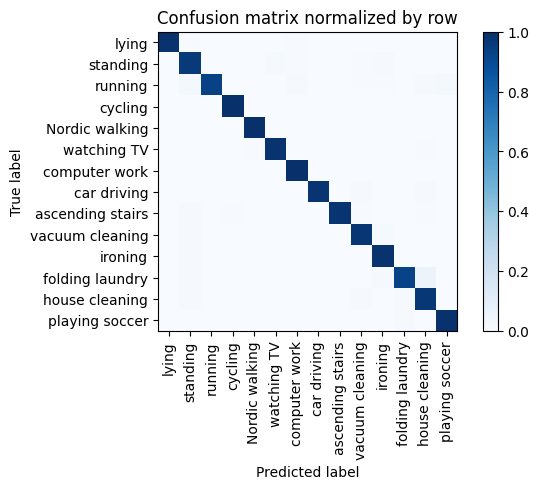

Training Epoch:  67%|██████▋   | 10/15 [05:46<03:06, 37.33s/it]

Overall accuracy: 0.979

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.995      0.991      0.139        580|	 house cleaning: 0.002,	watching TV: 0.002,	
         ironing       0.974      0.987      0.980      0.109        454|	 standing: 0.011,	vacuum cleaning: 0.002,	
           lying       0.997      0.985      0.991      0.096        398|	 computer work: 0.008,	standing: 0.005,	
        standing       0.950      0.962      0.956      0.095        394|	 watching TV: 0.015,	ironing: 0.013,	
  house cleaning       0.948      0.969      0.958      0.086        356|	 vacuum cleaning: 0.011,	folding laundry: 0.008,	
  Nordic walking       0.997      0.997      0.997      0.085        352|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.964      0.976      0.970      0.079        329|	 ironing: 0.012,	standing: 0.009,	
         cycling       0.997      1.000      0.998      0.076   


train: 100%|██████████| 262/262 [00:34<00:00,  7.64batch/s, loss=106, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.40batch/s, loss=102]


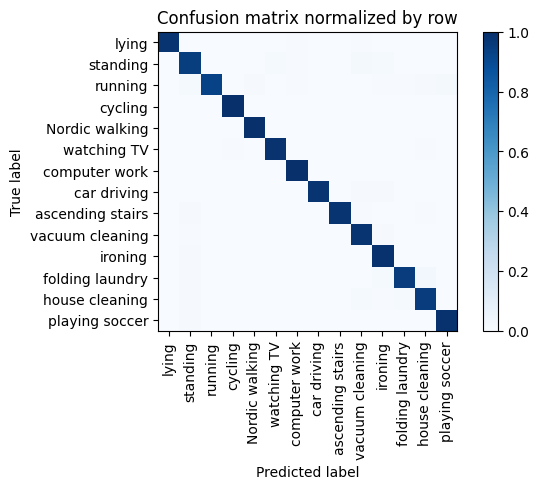

Training Epoch:  73%|███████▎  | 11/15 [06:25<02:31, 37.81s/it]

Overall accuracy: 0.978

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.990      0.997      0.993      0.139        578|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.966      0.989      0.977      0.109        455|	 standing: 0.009,	vacuum cleaning: 0.002,	
           lying       1.000      0.980      0.990      0.096        398|	 computer work: 0.008,	vacuum cleaning: 0.005,	
        standing       0.951      0.949      0.950      0.094        391|	 vacuum cleaning: 0.018,	ironing: 0.015,	
  house cleaning       0.966      0.953      0.959      0.086        358|	 folding laundry: 0.014,	vacuum cleaning: 0.014,	
  Nordic walking       0.994      1.000      0.997      0.085        355|	 playing soccer: 0.000,	house cleaning: 0.000,	
 vacuum cleaning       0.950      0.982      0.966      0.079        328|	 ironing: 0.009,	standing: 0.006,	
         cycling       0.997      1.000      0.998


train: 100%|██████████| 262/262 [00:34<00:00,  7.61batch/s, loss=100, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.15batch/s, loss=99.6]


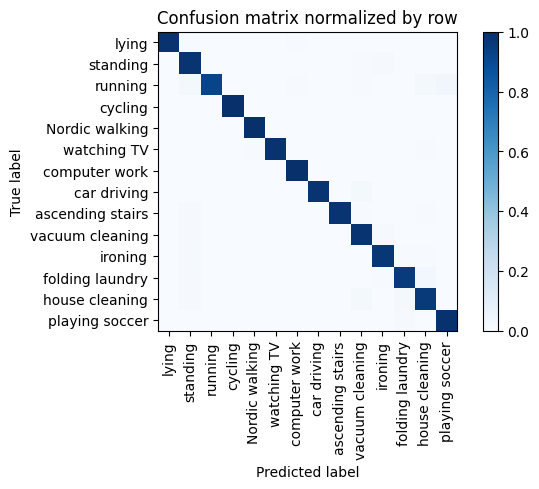

Training Epoch:  80%|████████  | 12/15 [07:04<01:54, 38.21s/it]

Overall accuracy: 0.980

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.991      0.995      0.993      0.139        578|	 house cleaning: 0.002,	watching TV: 0.002,	
         ironing       0.982      0.969      0.976      0.110        457|	 standing: 0.015,	house cleaning: 0.007,	
           lying       0.997      0.985      0.991      0.096        399|	 computer work: 0.008,	standing: 0.005,	
        standing       0.944      0.980      0.961      0.095        394|	 ironing: 0.010,	vacuum cleaning: 0.005,	
  house cleaning       0.955      0.958      0.956      0.085        355|	 folding laundry: 0.017,	vacuum cleaning: 0.017,	
  Nordic walking       0.997      1.000      0.999      0.085        355|	 playing soccer: 0.000,	house cleaning: 0.000,	
 vacuum cleaning       0.958      0.982      0.970      0.079        328|	 ironing: 0.009,	standing: 0.009,	
         cycling       1.000      1.000      1.000      0.076 


train: 100%|██████████| 262/262 [00:34<00:00,  7.63batch/s, loss=101, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.87batch/s, loss=99.6]


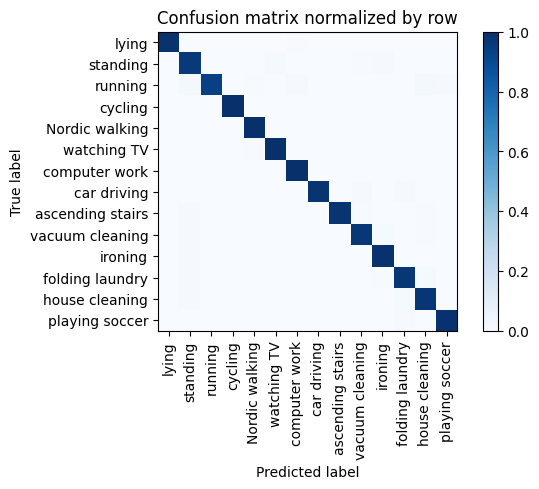

Training Epoch:  87%|████████▋ | 13/15 [07:43<01:16, 38.47s/it]

Overall accuracy: 0.982

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.991      0.997      0.994      0.140        582|	 house cleaning: 0.002,	lying: 0.002,	
         ironing       0.976      0.989      0.983      0.110        457|	 standing: 0.009,	vacuum cleaning: 0.002,	
           lying       0.997      0.985      0.991      0.095        395|	 computer work: 0.005,	house cleaning: 0.003,	
        standing       0.955      0.964      0.960      0.095        394|	 ironing: 0.013,	watching TV: 0.013,	
  house cleaning       0.967      0.975      0.971      0.086        356|	 folding laundry: 0.014,	standing: 0.008,	
  Nordic walking       0.994      0.997      0.996      0.085        354|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.972      0.970      0.971      0.079        328|	 ironing: 0.015,	standing: 0.009,	
         cycling       1.000      1.000      1.000      0.076        31


train: 100%|██████████| 262/262 [00:33<00:00,  7.73batch/s, loss=101, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.43batch/s, loss=97.7]


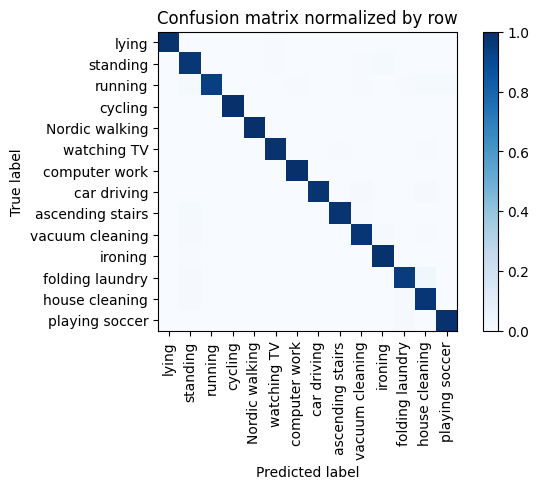

Training Epoch:  93%|█████████▎| 14/15 [08:22<00:38, 38.48s/it]

Overall accuracy: 0.982

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.997      0.997      0.139        577|	 house cleaning: 0.002,	lying: 0.002,	
         ironing       0.983      0.989      0.986      0.109        455|	 standing: 0.007,	house cleaning: 0.002,	
           lying       0.997      0.985      0.991      0.096        399|	 watching TV: 0.008,	house cleaning: 0.003,	
        standing       0.953      0.972      0.962      0.095        395|	 ironing: 0.013,	watching TV: 0.008,	
  house cleaning       0.951      0.975      0.963      0.086        356|	 folding laundry: 0.011,	standing: 0.011,	
  Nordic walking       1.000      0.997      0.999      0.085        354|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.972      0.975      0.974      0.078        324|	 ironing: 0.009,	standing: 0.009,	
         cycling       1.000      1.000      1.000      0.076        316|	


train: 100%|██████████| 262/262 [00:34<00:00,  7.67batch/s, loss=103, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.23batch/s, loss=98.8]


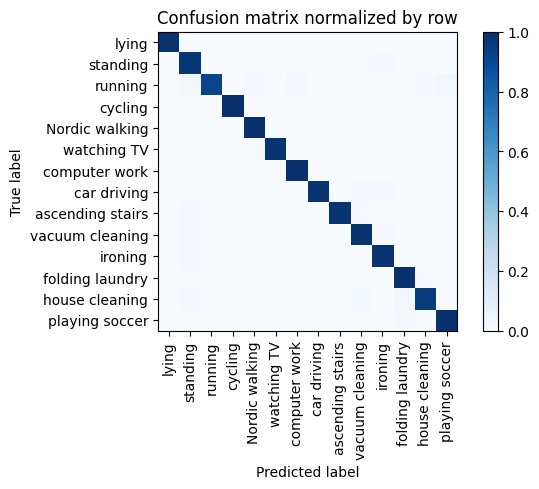

Overall accuracy: 0.982

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.998      0.993      0.140        581|	 house cleaning: 0.002,	playing soccer: 0.000,	
         ironing       0.980      0.987      0.984      0.110        456|	 standing: 0.009,	house cleaning: 0.002,	
        standing       0.955      0.970      0.963      0.095        397|	 ironing: 0.013,	watching TV: 0.008,	
           lying       1.000      0.985      0.992      0.095        394|	 computer work: 0.005,	house cleaning: 0.003,	
  house cleaning       0.980      0.949      0.964      0.085        355|	 folding laundry: 0.023,	vacuum cleaning: 0.014,	
  Nordic walking       0.992      0.997      0.994      0.085        353|	 vacuum cleaning: 0.003,	playing soccer: 0.000,	
 vacuum cleaning       0.961      0.982      0.971      0.079        329|	 ironing: 0.009,	standing: 0.009,	
         cycling       1.000      1.000      1.000      

unseen: 100%|██████████| 86/86 [00:05<00:00, 15.54batch/s, loss=117]


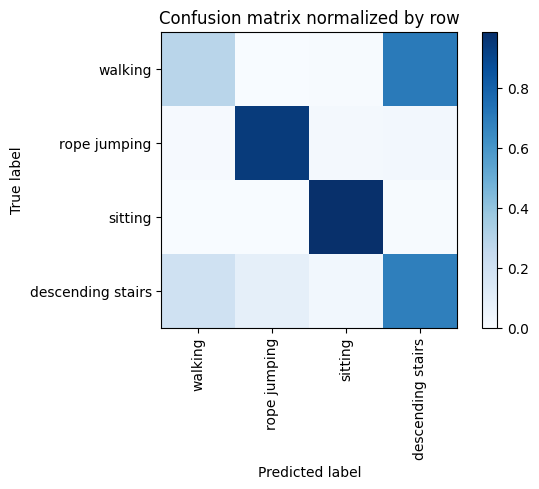

Overall accuracy: 0.638

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.772      0.289      0.421      0.422       2323|	 descending stairs: 0.705,	sitting: 0.004,	
          sitting       0.975      0.989      0.982      0.324       1785|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.279      0.685      0.396      0.171        939|	 walking: 0.200,	rope jumping: 0.085,	
     rope jumping       0.837      0.943      0.887      0.083        457|	 descending stairs: 0.026,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.759      0.638      0.637        1.0       5504|	      

{'accuracy': 0.6380813953488372, 'precision': 0.7154679213242852, 'recall': 0.7266287745851434, 'f1': 0.6714629109342987}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum cleaning',

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 242/242 [00:29<00:00,  8.20batch/s, loss=106, accuracy=0.891]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 16.49batch/s, loss=110]


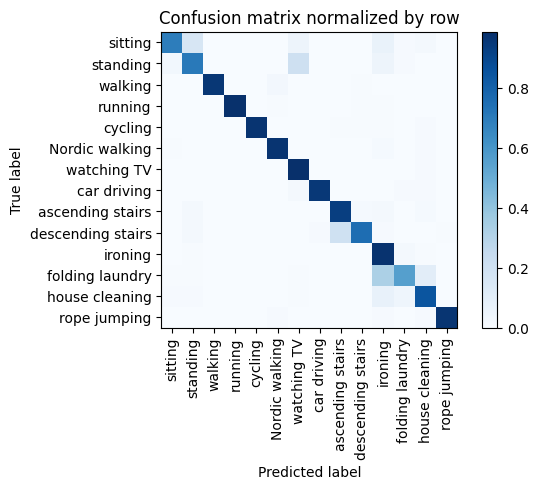

Training Epoch:   7%|▋         | 1/15 [00:33<07:50, 33.59s/it]

Overall accuracy: 0.877

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.961      0.980      0.128        492|	 Nordic walking: 0.024,	descending stairs: 0.006,	
          ironing       0.759      0.975      0.854      0.126        484|	 folding laundry: 0.017,	house cleaning: 0.004,	
   Nordic walking       0.960      0.970      0.965      0.096        369|	 ironing: 0.014,	house cleaning: 0.008,	
         standing       0.793      0.710      0.749      0.094        362|	 watching TV: 0.202,	ironing: 0.050,	
   house cleaning       0.865      0.848      0.856      0.089        341|	 ironing: 0.073,	folding laundry: 0.044,	
          sitting       0.935      0.695      0.797      0.086        331|	 standing: 0.160,	ironing: 0.066,	
          cycling       1.000      0.972      0.986      0.085        325|	 house cleaning: 0.009,	ironing: 0.006,	
  folding laundry       0.792      0.557      0.654      0.0


train: 100%|██████████| 242/242 [00:29<00:00,  8.17batch/s, loss=109, accuracy=0.875]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 16.26batch/s, loss=108]


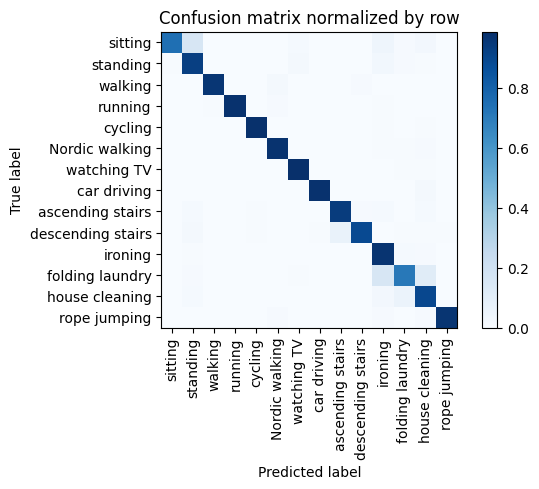

Training Epoch:  13%|█▎        | 2/15 [01:07<07:16, 33.61s/it]

Overall accuracy: 0.924

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.963      0.980      0.128        493|	 Nordic walking: 0.022,	descending stairs: 0.008,	
          ironing       0.858      0.971      0.911      0.125        480|	 folding laundry: 0.015,	house cleaning: 0.010,	
   Nordic walking       0.960      0.976      0.968      0.096        368|	 house cleaning: 0.011,	folding laundry: 0.005,	
         standing       0.831      0.931      0.878      0.094        360|	 ironing: 0.028,	watching TV: 0.022,	
   house cleaning       0.852      0.900      0.875      0.088        339|	 folding laundry: 0.059,	ironing: 0.024,	
          sitting       0.984      0.749      0.851      0.087        335|	 standing: 0.158,	ironing: 0.045,	
          cycling       0.994      0.985      0.989      0.084        324|	 house cleaning: 0.006,	ironing: 0.006,	
  folding laundry       0.802      0.711      0.754 


train: 100%|██████████| 242/242 [00:25<00:00,  9.40batch/s, loss=107, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:02<00:00, 20.16batch/s, loss=110]


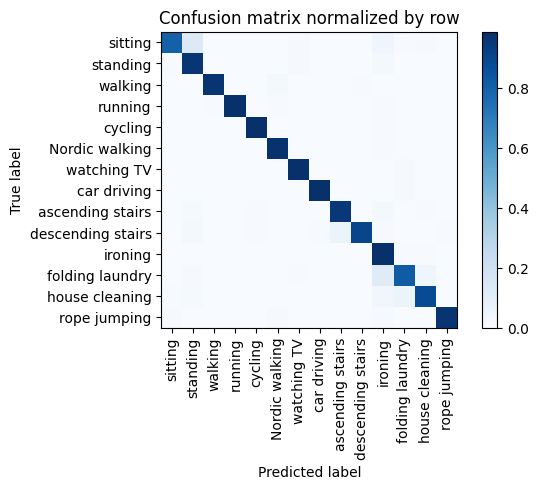

Training Epoch:  20%|██        | 3/15 [01:36<06:18, 31.53s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.974      0.986      0.128        491|	 Nordic walking: 0.016,	descending stairs: 0.006,	
          ironing       0.873      0.985      0.926      0.126        482|	 folding laundry: 0.006,	house cleaning: 0.004,	
   Nordic walking       0.971      0.981      0.976      0.096        369|	 ironing: 0.005,	house cleaning: 0.003,	
         standing       0.857      0.964      0.907      0.094        361|	 ironing: 0.019,	watching TV: 0.008,	
   house cleaning       0.946      0.885      0.915      0.088        339|	 folding laundry: 0.059,	ironing: 0.032,	
          sitting       0.971      0.802      0.879      0.086        329|	 standing: 0.131,	ironing: 0.040,	
          cycling       0.991      0.988      0.989      0.085        327|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.851      0.823      0.837      0.0


train: 100%|██████████| 242/242 [00:25<00:00,  9.36batch/s, loss=108, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.58batch/s, loss=107]


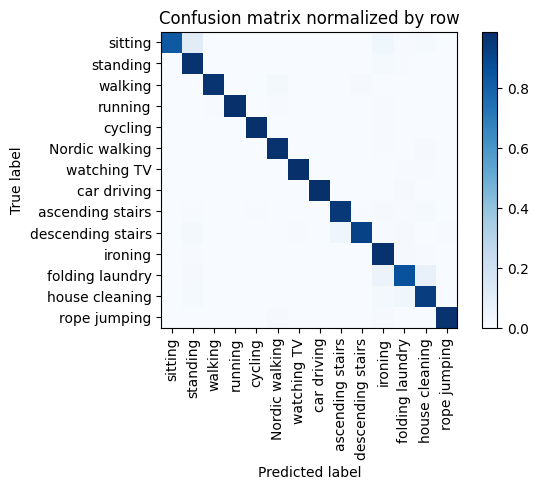

Training Epoch:  27%|██▋       | 4/15 [02:05<05:36, 30.64s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.969      0.983      0.127        488|	 Nordic walking: 0.016,	descending stairs: 0.008,	
          ironing       0.912      0.981      0.945      0.123        474|	 folding laundry: 0.008,	house cleaning: 0.006,	
   Nordic walking       0.973      0.978      0.976      0.096        370|	 house cleaning: 0.008,	ironing: 0.005,	
         standing       0.874      0.975      0.922      0.093        357|	 ironing: 0.014,	folding laundry: 0.006,	
   house cleaning       0.912      0.933      0.922      0.089        343|	 folding laundry: 0.035,	ironing: 0.017,	
          sitting       0.989      0.833      0.904      0.087        335|	 standing: 0.110,	ironing: 0.036,	
          cycling       0.994      0.988      0.991      0.085        325|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.876      0.863      0.869     


train: 100%|██████████| 242/242 [00:25<00:00,  9.32batch/s, loss=107, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.95batch/s, loss=107]


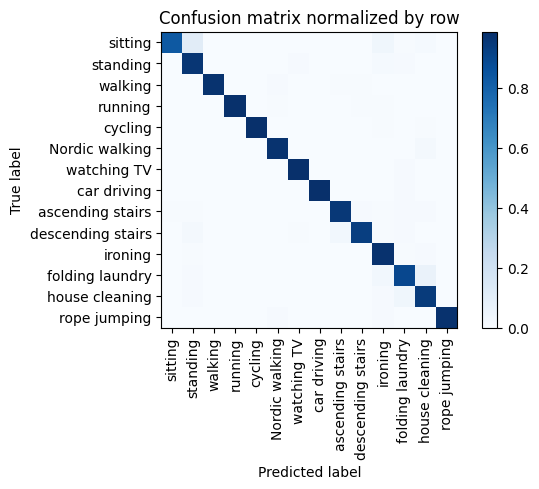

Training Epoch:  33%|███▎      | 5/15 [02:34<05:01, 30.15s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.977      0.989      0.127        488|	 Nordic walking: 0.008,	descending stairs: 0.004,	
          ironing       0.934      0.981      0.957      0.124        478|	 house cleaning: 0.008,	folding laundry: 0.006,	
   Nordic walking       0.984      0.976      0.980      0.097        373|	 house cleaning: 0.016,	folding laundry: 0.003,	
         standing       0.878      0.964      0.919      0.093        358|	 ironing: 0.014,	folding laundry: 0.011,	
   house cleaning       0.907      0.944      0.926      0.089        342|	 folding laundry: 0.035,	ironing: 0.009,	
          sitting       0.993      0.834      0.906      0.086        331|	 standing: 0.109,	ironing: 0.036,	
          cycling       1.000      0.988      0.994      0.085        328|	 house cleaning: 0.006,	ironing: 0.006,	
  folding laundry       0.867      0.900      0.


train: 100%|██████████| 242/242 [00:26<00:00,  9.28batch/s, loss=106, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.05batch/s, loss=104]


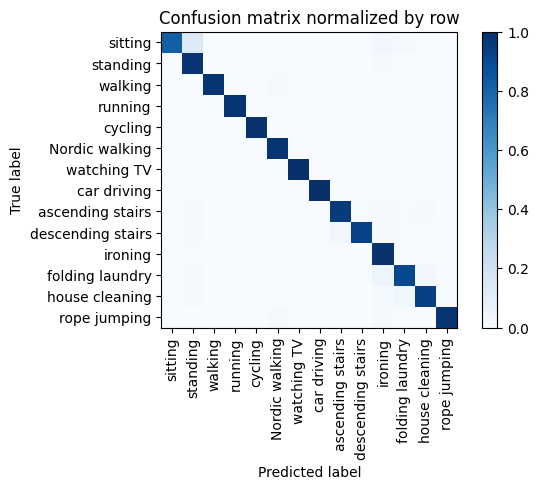

Training Epoch:  40%|████      | 6/15 [03:04<04:29, 29.96s/it]

Overall accuracy: 0.957

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.980      0.989      0.128        491|	 Nordic walking: 0.010,	descending stairs: 0.004,	
          ironing       0.924      0.985      0.953      0.124        478|	 house cleaning: 0.006,	folding laundry: 0.004,	
   Nordic walking       0.981      0.978      0.980      0.097        371|	 cycling: 0.005,	house cleaning: 0.003,	
         standing       0.857      0.977      0.913      0.092        355|	 ironing: 0.014,	house cleaning: 0.003,	
   house cleaning       0.947      0.935      0.941      0.089        341|	 folding laundry: 0.035,	ironing: 0.015,	
          sitting       0.989      0.817      0.895      0.087        334|	 standing: 0.135,	ironing: 0.030,	
          cycling       0.988      0.988      0.988      0.085        327|	 house cleaning: 0.006,	ironing: 0.006,	
  folding laundry       0.902      0.906      0.904      


train: 100%|██████████| 242/242 [00:26<00:00,  9.22batch/s, loss=106, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.93batch/s, loss=105]


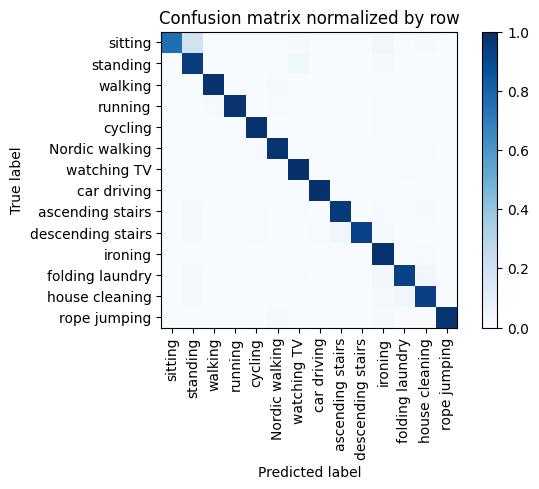

Training Epoch:  47%|████▋     | 7/15 [03:34<03:58, 29.84s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.986      0.992      0.126        484|	 Nordic walking: 0.010,	descending stairs: 0.002,	
          ironing       0.933      0.990      0.961      0.125        480|	 house cleaning: 0.006,	folding laundry: 0.002,	
   Nordic walking       0.981      0.981      0.981      0.096        370|	 house cleaning: 0.005,	cycling: 0.005,	
         standing       0.821      0.950      0.881      0.094        361|	 watching TV: 0.036,	ironing: 0.014,	
   house cleaning       0.947      0.936      0.941      0.089        343|	 folding laundry: 0.032,	ironing: 0.017,	
          sitting       0.992      0.754      0.857      0.087        334|	 standing: 0.192,	ironing: 0.033,	
          cycling       0.985      0.991      0.988      0.085        326|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.934      0.929      0.931      0.0


train: 100%|██████████| 242/242 [00:26<00:00,  9.16batch/s, loss=104, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.94batch/s, loss=102]


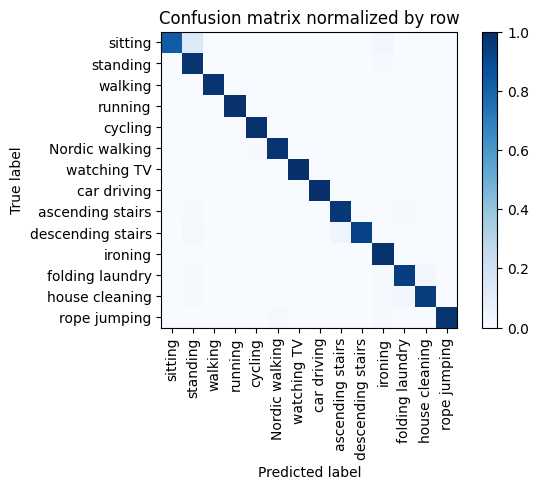

Training Epoch:  53%|█████▎    | 8/15 [04:03<03:28, 29.82s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.984      0.992      0.127        488|	 descending stairs: 0.006,	Nordic walking: 0.006,	
          ironing       0.954      0.990      0.971      0.126        482|	 standing: 0.006,	house cleaning: 0.004,	
   Nordic walking       0.986      0.978      0.982      0.097        372|	 cycling: 0.008,	house cleaning: 0.005,	
         standing       0.854      0.983      0.914      0.094        362|	 ironing: 0.011,	watching TV: 0.006,	
   house cleaning       0.955      0.950      0.953      0.088        338|	 folding laundry: 0.024,	ironing: 0.012,	
          sitting       0.993      0.826      0.902      0.087        334|	 standing: 0.135,	ironing: 0.024,	
          cycling       0.988      0.991      0.989      0.085        327|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.938      0.942      0.940      0.054     


train: 100%|██████████| 242/242 [00:26<00:00,  9.19batch/s, loss=105, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.45batch/s, loss=101]


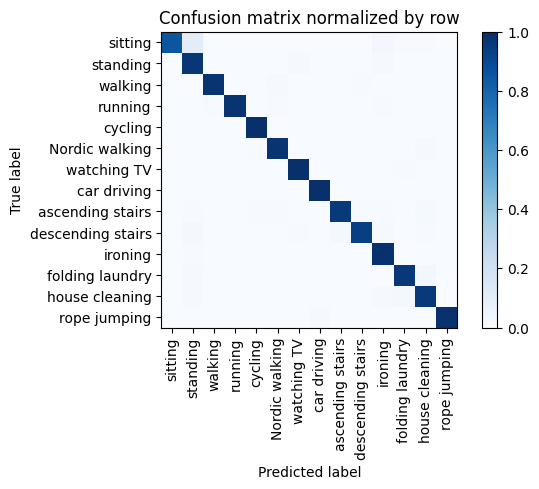

Training Epoch:  60%|██████    | 9/15 [04:33<02:58, 29.79s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.984      0.991      0.127        487|	 Nordic walking: 0.008,	descending stairs: 0.004,	
          ironing       0.956      0.990      0.972      0.125        479|	 standing: 0.004,	house cleaning: 0.002,	
   Nordic walking       0.984      0.984      0.984      0.097        371|	 house cleaning: 0.008,	cycling: 0.005,	
         standing       0.884      0.970      0.925      0.094        361|	 ironing: 0.011,	watching TV: 0.011,	
   house cleaning       0.954      0.962      0.958      0.089        342|	 folding laundry: 0.020,	ironing: 0.009,	
          sitting       0.986      0.852      0.914      0.086        332|	 standing: 0.105,	ironing: 0.030,	
          cycling       0.988      0.994      0.991      0.085        325|	 ironing: 0.003,	sitting: 0.003,	
  folding laundry       0.948      0.967      0.957      0.054        209|


train: 100%|██████████| 242/242 [00:26<00:00,  9.05batch/s, loss=107, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.70batch/s, loss=105]


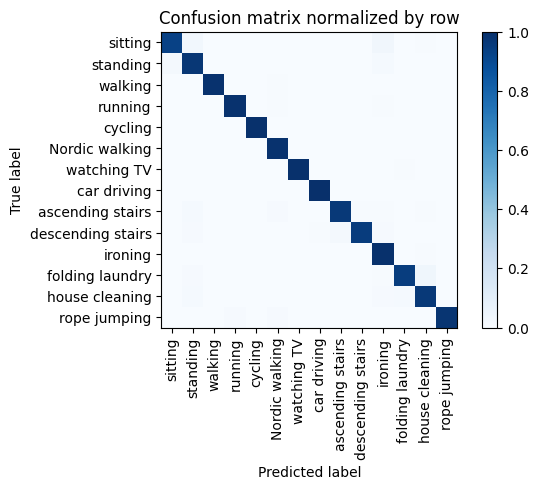

Training Epoch:  67%|██████▋   | 10/15 [05:03<02:29, 29.89s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.990      0.995      0.127        487|	 Nordic walking: 0.004,	descending stairs: 0.002,	
          ironing       0.950      0.994      0.971      0.125        480|	 house cleaning: 0.004,	standing: 0.002,	
   Nordic walking       0.984      0.992      0.988      0.097        372|	 house cleaning: 0.003,	cycling: 0.003,	
         standing       0.941      0.970      0.955      0.094        361|	 sitting: 0.017,	ironing: 0.014,	
   house cleaning       0.956      0.965      0.960      0.089        340|	 folding laundry: 0.012,	standing: 0.012,	
          sitting       0.975      0.931      0.953      0.087        334|	 ironing: 0.033,	standing: 0.030,	
          cycling       0.994      0.994      0.994      0.085        325|	 house cleaning: 0.003,	ironing: 0.003,	
  folding laundry       0.976      0.948      0.962      0.055        


train: 100%|██████████| 242/242 [00:27<00:00,  8.92batch/s, loss=108, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.35batch/s, loss=107]


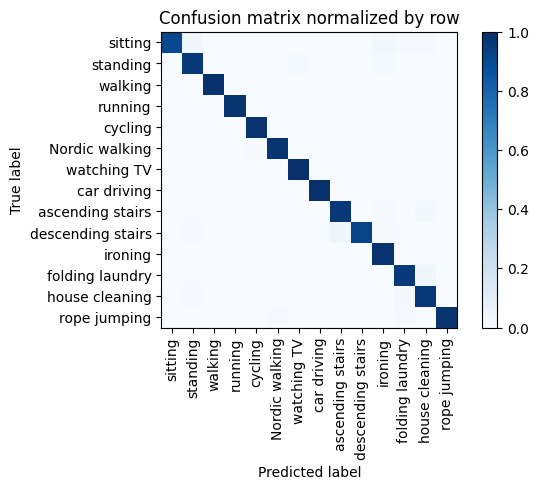

Training Epoch:  73%|███████▎  | 11/15 [05:34<02:00, 30.10s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.990      0.994      0.127        489|	 descending stairs: 0.004,	Nordic walking: 0.004,	
          ironing       0.954      0.988      0.970      0.126        483|	 house cleaning: 0.006,	folding laundry: 0.004,	
   Nordic walking       0.989      0.981      0.985      0.096        370|	 cycling: 0.008,	house cleaning: 0.005,	
         standing       0.939      0.967      0.953      0.095        363|	 ironing: 0.014,	watching TV: 0.014,	
   house cleaning       0.938      0.971      0.954      0.089        342|	 folding laundry: 0.018,	standing: 0.009,	
          sitting       1.000      0.903      0.949      0.086        330|	 standing: 0.045,	ironing: 0.030,	
          cycling       0.988      0.988      0.988      0.085        327|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.922      0.957      0.940      0.


train: 100%|██████████| 242/242 [00:27<00:00,  8.91batch/s, loss=106, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.73batch/s, loss=104]


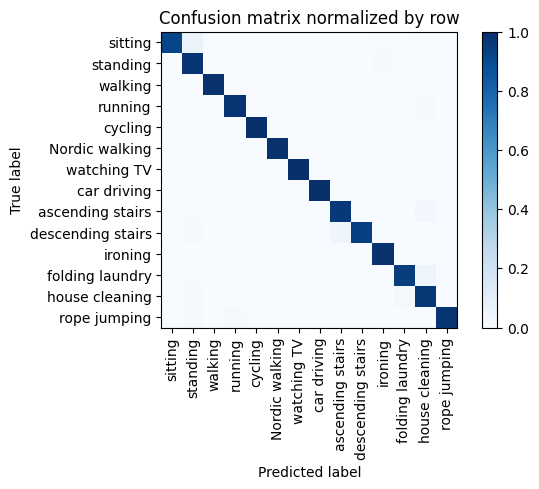

Training Epoch:  80%|████████  | 12/15 [06:04<01:30, 30.24s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.992      0.996      0.127        488|	 Nordic walking: 0.006,	descending stairs: 0.002,	
          ironing       0.984      0.988      0.986      0.126        483|	 house cleaning: 0.006,	folding laundry: 0.002,	
   Nordic walking       0.989      0.992      0.991      0.096        370|	 house cleaning: 0.005,	standing: 0.003,	
         standing       0.917      0.981      0.948      0.094        362|	 ironing: 0.011,	house cleaning: 0.003,	
   house cleaning       0.924      0.971      0.947      0.088        339|	 folding laundry: 0.018,	standing: 0.009,	
          sitting       0.994      0.919      0.955      0.087        333|	 standing: 0.066,	house cleaning: 0.006,	
          cycling       0.997      0.994      0.995      0.085        325|	 house cleaning: 0.006,	rope jumping: 0.000,	
  folding laundry       0.962      0.948   


train: 100%|██████████| 242/242 [00:26<00:00,  9.20batch/s, loss=106, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.37batch/s, loss=105]


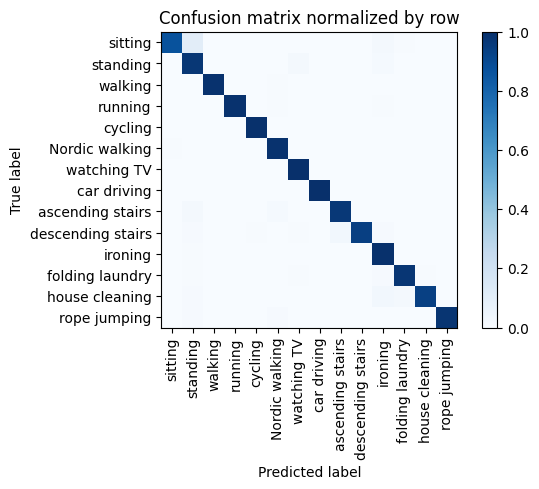

Training Epoch:  87%|████████▋ | 13/15 [06:34<01:00, 30.13s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.992      0.996      0.127        489|	 Nordic walking: 0.004,	descending stairs: 0.002,	
          ironing       0.943      0.994      0.968      0.126        482|	 standing: 0.004,	sitting: 0.002,	
   Nordic walking       0.981      0.992      0.987      0.096        370|	 sitting: 0.005,	ironing: 0.003,	
         standing       0.877      0.969      0.921      0.094        360|	 watching TV: 0.017,	ironing: 0.014,	
   house cleaning       0.994      0.936      0.964      0.089        342|	 ironing: 0.029,	folding laundry: 0.020,	
          sitting       0.986      0.868      0.923      0.087        333|	 standing: 0.105,	ironing: 0.021,	
          cycling       0.997      0.994      0.995      0.085        327|	 house cleaning: 0.003,	ironing: 0.003,	
  folding laundry       0.958      0.976      0.967      0.054        208|	 ironi


train: 100%|██████████| 242/242 [00:26<00:00,  9.09batch/s, loss=109, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.65batch/s, loss=104]


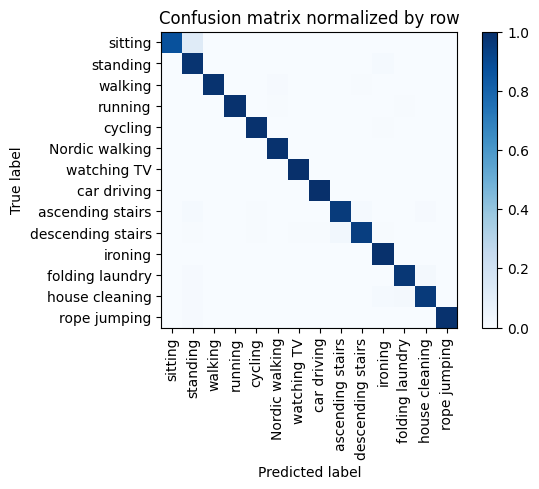

Training Epoch:  93%|█████████▎| 14/15 [07:04<00:30, 30.10s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.986      0.993      0.128        490|	 Nordic walking: 0.010,	descending stairs: 0.004,	
          ironing       0.971      0.996      0.984      0.125        479|	 house cleaning: 0.002,	standing: 0.002,	
   Nordic walking       0.984      0.989      0.987      0.097        371|	 house cleaning: 0.003,	folding laundry: 0.003,	
         standing       0.874      0.981      0.924      0.094        362|	 ironing: 0.014,	folding laundry: 0.003,	
   house cleaning       0.970      0.958      0.964      0.087        335|	 folding laundry: 0.018,	ironing: 0.012,	
          sitting       0.993      0.872      0.928      0.087        335|	 standing: 0.119,	house cleaning: 0.003,	
          cycling       0.994      0.991      0.992      0.085        326|	 ironing: 0.006,	house cleaning: 0.003,	
  folding laundry       0.958      0.972      0.


train: 100%|██████████| 242/242 [00:26<00:00,  9.20batch/s, loss=102, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 19.69batch/s, loss=103]


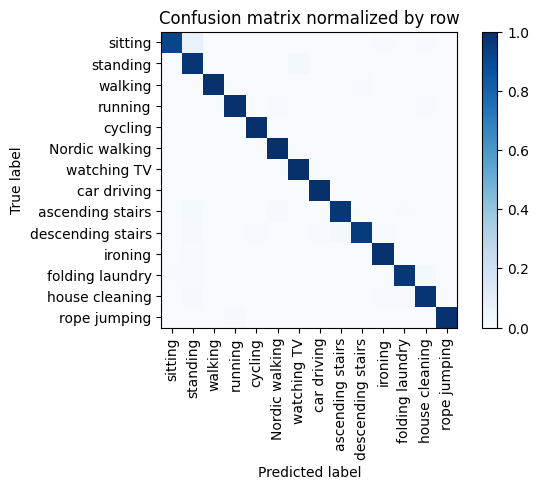

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.992      0.996      0.127        488|	 descending stairs: 0.004,	ascending stairs: 0.002,	
          ironing       0.988      0.990      0.989      0.127        486|	 standing: 0.004,	house cleaning: 0.002,	
   Nordic walking       0.992      0.995      0.993      0.097        372|	 house cleaning: 0.003,	sitting: 0.003,	
         standing       0.911      0.975      0.941      0.092        355|	 watching TV: 0.020,	ironing: 0.003,	
   house cleaning       0.971      0.980      0.975      0.089        342|	 standing: 0.009,	folding laundry: 0.006,	
          sitting       0.990      0.915      0.951      0.086        331|	 standing: 0.069,	house cleaning: 0.006,	
          cycling       0.994      0.997      0.995      0.084        324|	 house cleaning: 0.003,	rope jumping: 0.000,	
  folding laundry       0.981      0.972      0.976 

unseen: 100%|██████████| 111/111 [00:05<00:00, 19.68batch/s, loss=117]


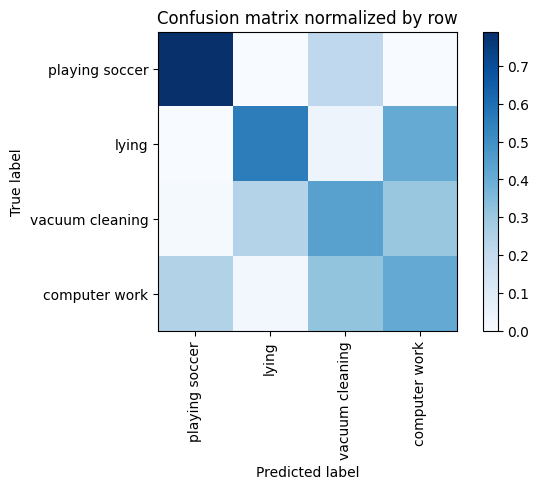

Overall accuracy: 0.480

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.496      0.413      0.451      0.432       3067|	 vacuum cleaning: 0.317,	playing soccer: 0.249,	
          lying       0.684      0.554      0.612      0.264       1875|	 computer work: 0.407,	vacuum cleaning: 0.038,	
vacuum cleaning       0.396      0.439      0.416      0.240       1705|	 computer work: 0.306,	lying: 0.243,	
 playing soccer       0.314      0.790      0.450      0.064        457|	 vacuum cleaning: 0.210,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.510      0.480      0.485        1.0       7104|	      

{'accuracy': 0.48043355855855857, 'precision': 0.47279189050747583, 'recall': 0.5487563128344505, 'f1': 0.4822329725842869}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 276/276 [00:34<00:00,  8.02batch/s, loss=109, accuracy=0.781]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 15.88batch/s, loss=116]


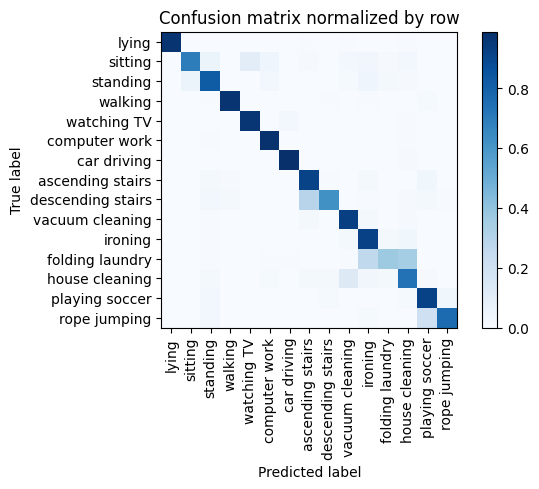

Training Epoch:   7%|▋         | 1/15 [00:39<09:07, 39.11s/it]

Overall accuracy: 0.863

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.954      0.979      0.966      0.149        659|	 house cleaning: 0.006,	standing: 0.006,	
          walking       0.985      0.968      0.977      0.108        475|	 playing soccer: 0.015,	descending stairs: 0.006,	
          ironing       0.800      0.921      0.857      0.106        470|	 house cleaning: 0.038,	folding laundry: 0.017,	
         standing       0.868      0.823      0.845      0.088        390|	 sitting: 0.054,	ironing: 0.046,	
   house cleaning       0.709      0.737      0.723      0.081        357|	 vacuum cleaning: 0.126,	ironing: 0.034,	
            lying       0.997      0.971      0.984      0.079        350|	 house cleaning: 0.006,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.817      0.931      0.870      0.078        346|	 ironing: 0.023,	ascending stairs: 0.023,	
          sitting       0.906      0.695      0


train: 100%|██████████| 276/276 [00:33<00:00,  8.31batch/s, loss=106, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 20.14batch/s, loss=107]


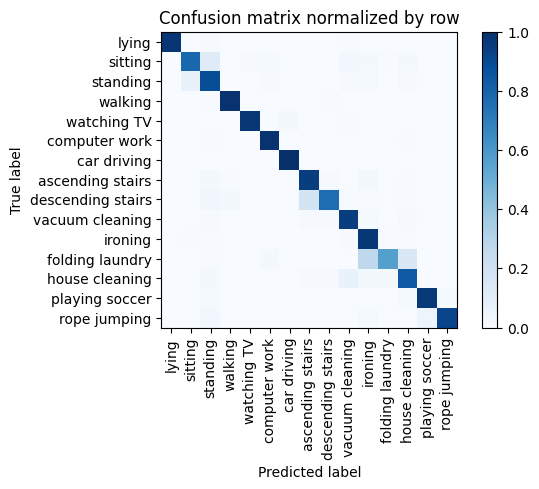

Training Epoch:  13%|█▎        | 2/15 [01:16<08:12, 37.87s/it]

Overall accuracy: 0.913

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.986      0.983      0.149        658|	 house cleaning: 0.005,	standing: 0.005,	
          walking       0.991      0.987      0.989      0.107        472|	 descending stairs: 0.004,	standing: 0.004,	
          ironing       0.839      0.970      0.900      0.106        469|	 vacuum cleaning: 0.011,	folding laundry: 0.006,	
         standing       0.821      0.885      0.852      0.088        390|	 sitting: 0.069,	ironing: 0.015,	
   house cleaning       0.862      0.835      0.848      0.081        358|	 vacuum cleaning: 0.067,	ironing: 0.028,	
            lying       0.997      0.974      0.986      0.079        351|	 standing: 0.009,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.879      0.948      0.912      0.078        346|	 ironing: 0.014,	descending stairs: 0.012,	
          sitting       0.898      0.789      0.840      


train: 100%|██████████| 276/276 [00:29<00:00,  9.23batch/s, loss=104, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.71batch/s, loss=106]


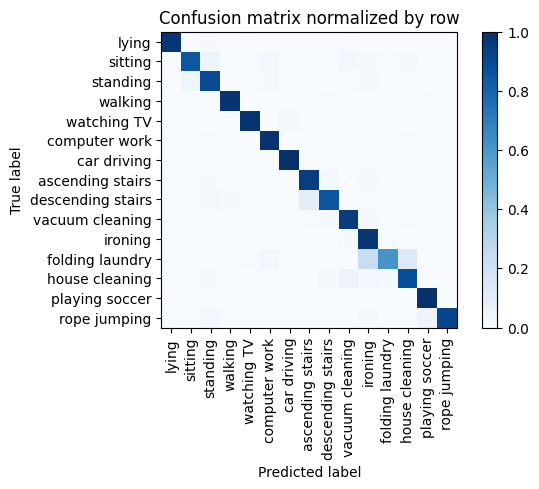

Training Epoch:  20%|██        | 3/15 [01:49<07:11, 36.00s/it]

Overall accuracy: 0.930

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.966      0.988      0.977      0.150        661|	 house cleaning: 0.005,	standing: 0.005,	
          walking       0.996      0.981      0.988      0.107        473|	 descending stairs: 0.006,	standing: 0.006,	
          ironing       0.853      0.972      0.909      0.107        471|	 vacuum cleaning: 0.015,	folding laundry: 0.006,	
         standing       0.879      0.902      0.890      0.088        387|	 sitting: 0.041,	ironing: 0.021,	
   house cleaning       0.903      0.880      0.891      0.081        358|	 vacuum cleaning: 0.053,	ironing: 0.020,	
            lying       1.000      0.974      0.987      0.079        351|	 standing: 0.009,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.891      0.951      0.920      0.078        345|	 ironing: 0.020,	descending stairs: 0.012,	
          sitting       0.947      0.851      0.897      


train: 100%|██████████| 276/276 [00:30<00:00,  9.07batch/s, loss=101, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.33batch/s, loss=105]


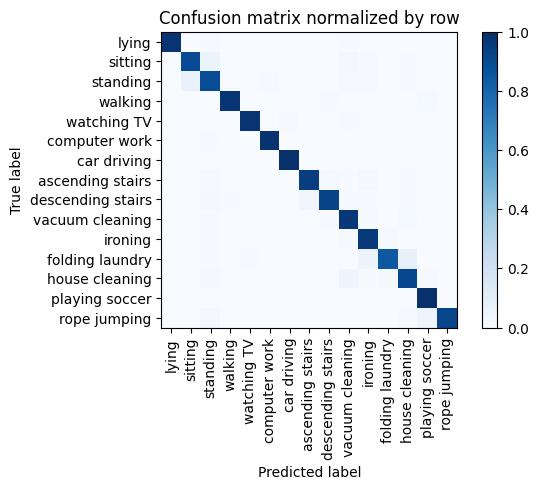

Training Epoch:  27%|██▋       | 4/15 [02:24<06:30, 35.51s/it]

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.988      0.989      0.150        661|	 standing: 0.005,	house cleaning: 0.003,	
          walking       0.998      0.975      0.986      0.108        475|	 playing soccer: 0.013,	descending stairs: 0.004,	
          ironing       0.932      0.962      0.946      0.106        468|	 folding laundry: 0.015,	vacuum cleaning: 0.015,	
         standing       0.885      0.890      0.888      0.089        391|	 sitting: 0.069,	ironing: 0.013,	
   house cleaning       0.915      0.907      0.911      0.080        355|	 vacuum cleaning: 0.039,	folding laundry: 0.017,	
            lying       1.000      0.977      0.988      0.079        351|	 standing: 0.009,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.895      0.965      0.929      0.078        344|	 house cleaning: 0.015,	ironing: 0.009,	
          sitting       0.906      0.893      


train: 100%|██████████| 276/276 [00:31<00:00,  8.74batch/s, loss=105, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.28batch/s, loss=106]


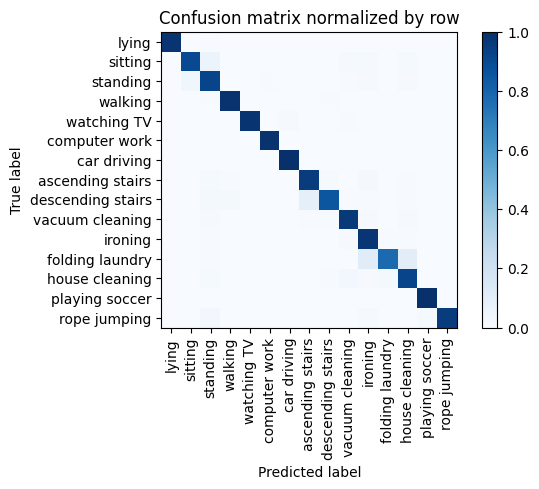

Training Epoch:  33%|███▎      | 5/15 [03:00<05:55, 35.59s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.988      0.991      0.150        661|	 house cleaning: 0.003,	ironing: 0.003,	
          walking       0.992      0.985      0.988      0.108        475|	 descending stairs: 0.004,	standing: 0.004,	
          ironing       0.910      0.976      0.942      0.106        468|	 vacuum cleaning: 0.011,	house cleaning: 0.004,	
         standing       0.893      0.921      0.907      0.088        390|	 sitting: 0.038,	house cleaning: 0.010,	
   house cleaning       0.899      0.919      0.909      0.081        357|	 vacuum cleaning: 0.031,	folding laundry: 0.020,	
            lying       0.997      0.977      0.987      0.079        351|	 standing: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.922      0.959      0.940      0.078        344|	 ironing: 0.012,	house cleaning: 0.009,	
          sitting       0.947      0.902      0.


train: 100%|██████████| 276/276 [00:29<00:00,  9.25batch/s, loss=108, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 20.37batch/s, loss=104]


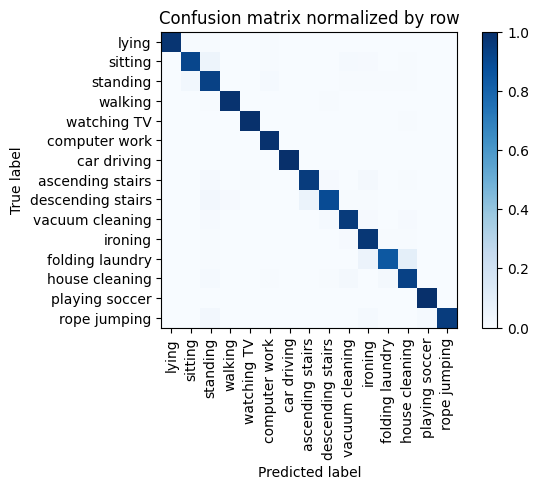

Training Epoch:  40%|████      | 6/15 [03:33<05:14, 34.90s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.991      0.987      0.150        661|	 lying: 0.003,	house cleaning: 0.002,	
          walking       0.996      0.987      0.992      0.107        473|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.941      0.972      0.956      0.107        472|	 vacuum cleaning: 0.011,	folding laundry: 0.006,	
         standing       0.894      0.931      0.912      0.088        390|	 sitting: 0.028,	computer work: 0.013,	
   house cleaning       0.918      0.933      0.925      0.081        358|	 folding laundry: 0.020,	vacuum cleaning: 0.020,	
            lying       0.994      0.977      0.986      0.079        350|	 computer work: 0.006,	standing: 0.006,	
  vacuum cleaning       0.943      0.956      0.949      0.078        343|	 descending stairs: 0.015,	ironing: 0.012,	
          sitting       0.956      0.911      0.


train: 100%|██████████| 276/276 [00:29<00:00,  9.44batch/s, loss=106, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 20.35batch/s, loss=107]


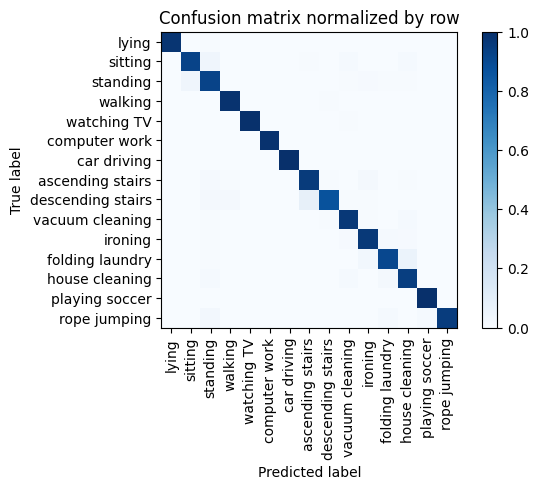

Training Epoch:  47%|████▋     | 7/15 [04:06<04:34, 34.27s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.989      0.993      0.149        660|	 house cleaning: 0.003,	ironing: 0.002,	
          walking       0.992      0.987      0.989      0.108        475|	 descending stairs: 0.004,	ironing: 0.002,	
          ironing       0.960      0.962      0.961      0.107        471|	 folding laundry: 0.013,	house cleaning: 0.008,	
         standing       0.907      0.926      0.916      0.088        390|	 sitting: 0.041,	ironing: 0.010,	
   house cleaning       0.918      0.944      0.931      0.081        358|	 folding laundry: 0.022,	vacuum cleaning: 0.014,	
            lying       0.997      0.977      0.987      0.079        348|	 standing: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.949      0.965      0.957      0.078        344|	 house cleaning: 0.015,	ironing: 0.006,	
          sitting       0.939      0.922      0.931     


train: 100%|██████████| 276/276 [00:28<00:00,  9.52batch/s, loss=102, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 20.26batch/s, loss=106]


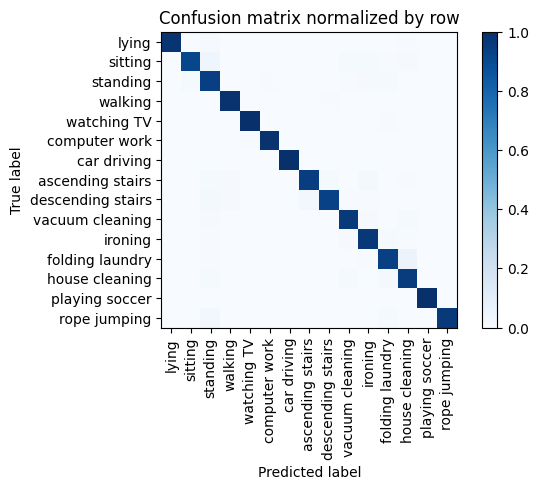

Training Epoch:  53%|█████▎    | 8/15 [04:39<03:56, 33.81s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.988      0.991      0.149        660|	 watching TV: 0.005,	house cleaning: 0.003,	
          walking       0.992      0.985      0.988      0.108        475|	 descending stairs: 0.004,	playing soccer: 0.002,	
          ironing       0.958      0.966      0.962      0.106        470|	 folding laundry: 0.013,	vacuum cleaning: 0.011,	
         standing       0.904      0.941      0.922      0.088        389|	 folding laundry: 0.015,	sitting: 0.013,	
   house cleaning       0.926      0.949      0.938      0.081        356|	 folding laundry: 0.020,	vacuum cleaning: 0.014,	
            lying       0.997      0.980      0.988      0.079        349|	 standing: 0.009,	house cleaning: 0.006,	
  vacuum cleaning       0.946      0.962      0.954      0.078        344|	 house cleaning: 0.015,	ironing: 0.012,	
          sitting       0.981      0


train: 100%|██████████| 276/276 [00:29<00:00,  9.33batch/s, loss=104, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 20.59batch/s, loss=105]


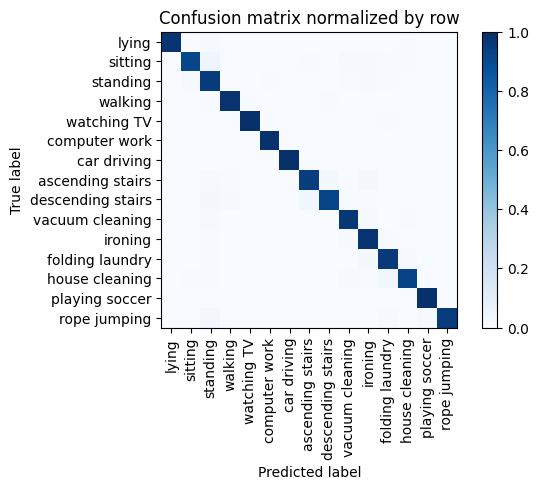

Training Epoch:  60%|██████    | 9/15 [05:13<03:21, 33.64s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.989      0.990      0.150        662|	 lying: 0.003,	house cleaning: 0.002,	
          walking       0.994      0.985      0.989      0.107        473|	 descending stairs: 0.004,	standing: 0.004,	
          ironing       0.947      0.977      0.961      0.107        471|	 vacuum cleaning: 0.013,	folding laundry: 0.004,	
         standing       0.907      0.954      0.930      0.088        390|	 ironing: 0.015,	sitting: 0.010,	
   house cleaning       0.974      0.927      0.950      0.081        357|	 folding laundry: 0.036,	vacuum cleaning: 0.014,	
            lying       0.994      0.980      0.987      0.079        350|	 standing: 0.009,	house cleaning: 0.006,	
  vacuum cleaning       0.949      0.971      0.960      0.078        344|	 ironing: 0.012,	standing: 0.009,	
          sitting       0.975      0.913      0.943      0.076


train: 100%|██████████| 276/276 [00:30<00:00,  9.12batch/s, loss=103, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.64batch/s, loss=107]


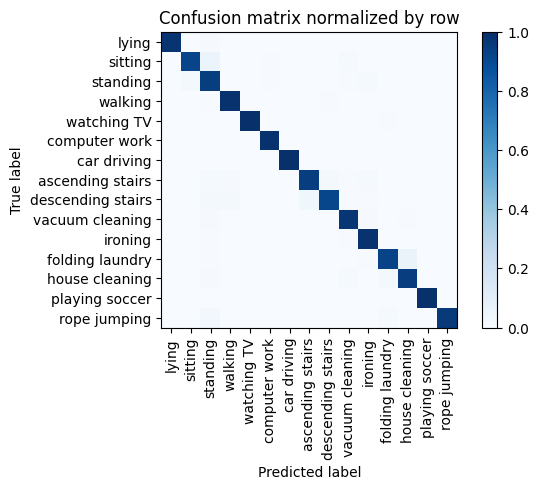

Training Epoch:  67%|██████▋   | 10/15 [05:47<02:48, 33.80s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.991      0.991      0.149        659|	 lying: 0.003,	house cleaning: 0.002,	
          walking       0.989      0.989      0.989      0.108        476|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.963      0.987      0.975      0.107        471|	 vacuum cleaning: 0.006,	standing: 0.004,	
         standing       0.894      0.949      0.920      0.088        390|	 sitting: 0.018,	ironing: 0.015,	
   house cleaning       0.949      0.944      0.947      0.081        358|	 folding laundry: 0.022,	vacuum cleaning: 0.014,	
            lying       0.994      0.980      0.987      0.079        350|	 standing: 0.011,	house cleaning: 0.003,	
  vacuum cleaning       0.952      0.974      0.963      0.078        345|	 ironing: 0.012,	standing: 0.009,	
          sitting       0.978      0.919      0.948      0.076       


train: 100%|██████████| 276/276 [00:30<00:00,  8.96batch/s, loss=101, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.82batch/s, loss=102]


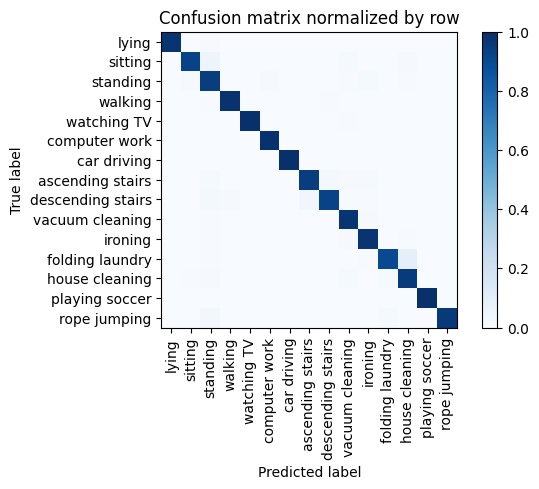

Training Epoch:  73%|███████▎  | 11/15 [06:21<02:16, 34.05s/it]

Overall accuracy: 0.966

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.989      0.990      0.148        654|	 lying: 0.003,	house cleaning: 0.002,	
          walking       0.996      0.985      0.990      0.108        475|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.968      0.977      0.973      0.107        471|	 vacuum cleaning: 0.008,	house cleaning: 0.006,	
         standing       0.903      0.949      0.925      0.089        391|	 ironing: 0.015,	computer work: 0.010,	
   house cleaning       0.924      0.955      0.939      0.081        357|	 folding laundry: 0.014,	vacuum cleaning: 0.014,	
            lying       0.994      0.980      0.987      0.079        351|	 standing: 0.009,	house cleaning: 0.003,	
  vacuum cleaning       0.936      0.983      0.959      0.078        343|	 ironing: 0.009,	standing: 0.006,	
          sitting       0.975      0.923      0.948      


train: 100%|██████████| 276/276 [00:30<00:00,  9.02batch/s, loss=105, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.67batch/s, loss=102]


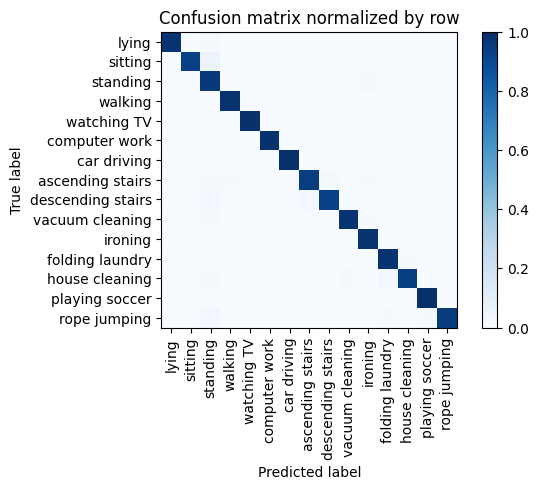

Training Epoch:  80%|████████  | 12/15 [06:56<01:42, 34.23s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.991      0.990      0.150        661|	 watching TV: 0.003,	lying: 0.003,	
          walking       0.994      0.987      0.990      0.107        474|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.968      0.981      0.975      0.106        468|	 standing: 0.006,	house cleaning: 0.004,	
         standing       0.889      0.964      0.925      0.089        391|	 ironing: 0.015,	computer work: 0.008,	
   house cleaning       0.982      0.941      0.961      0.081        356|	 folding laundry: 0.025,	vacuum cleaning: 0.014,	
            lying       0.991      0.983      0.987      0.079        351|	 standing: 0.011,	computer work: 0.003,	
  vacuum cleaning       0.966      0.977      0.971      0.078        345|	 ironing: 0.012,	standing: 0.009,	
          sitting       0.981      0.931      0.956      0.076      


train: 100%|██████████| 276/276 [00:31<00:00,  8.76batch/s, loss=105, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 18.53batch/s, loss=102]


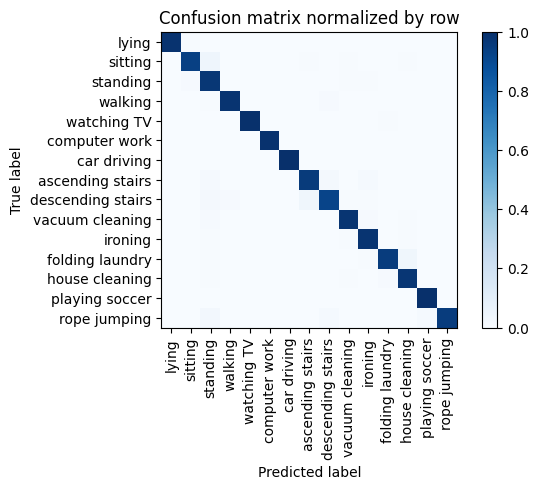

Training Epoch:  87%|████████▋ | 13/15 [07:32<01:09, 34.64s/it]

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.989      0.992      0.150        661|	 lying: 0.003,	house cleaning: 0.002,	
          walking       0.996      0.983      0.989      0.107        472|	 descending stairs: 0.008,	standing: 0.004,	
          ironing       0.975      0.981      0.978      0.107        471|	 house cleaning: 0.006,	standing: 0.006,	
         standing       0.911      0.969      0.939      0.089        391|	 sitting: 0.010,	ironing: 0.008,	
   house cleaning       0.956      0.975      0.965      0.080        355|	 folding laundry: 0.011,	vacuum cleaning: 0.006,	
            lying       0.994      0.986      0.990      0.079        349|	 sitting: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.974      0.977      0.975      0.078        346|	 ironing: 0.009,	standing: 0.009,	
          sitting       0.978      0.935      0.956      0.076        3


train: 100%|██████████| 276/276 [00:31<00:00,  8.68batch/s, loss=100, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.25batch/s, loss=106]


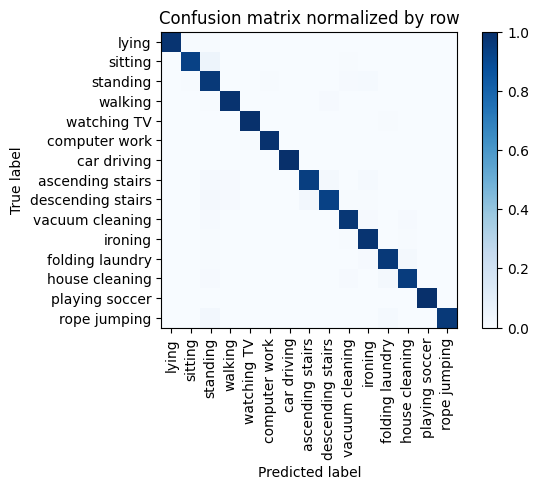

Training Epoch:  93%|█████████▎| 14/15 [08:07<00:34, 34.98s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.989      0.991      0.149        660|	 watching TV: 0.006,	folding laundry: 0.002,	
          walking       0.992      0.985      0.988      0.107        474|	 descending stairs: 0.011,	standing: 0.004,	
          ironing       0.962      0.981      0.971      0.106        469|	 house cleaning: 0.006,	standing: 0.006,	
         standing       0.902      0.962      0.931      0.089        391|	 ironing: 0.013,	vacuum cleaning: 0.010,	
   house cleaning       0.969      0.950      0.959      0.081        358|	 folding laundry: 0.020,	vacuum cleaning: 0.011,	
            lying       0.997      0.983      0.990      0.079        351|	 standing: 0.006,	sitting: 0.006,	
  vacuum cleaning       0.963      0.971      0.967      0.078        345|	 ironing: 0.012,	house cleaning: 0.009,	
          sitting       0.984      0.932      0.957     


train: 100%|██████████| 276/276 [00:31<00:00,  8.76batch/s, loss=104, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 19.34batch/s, loss=104] 


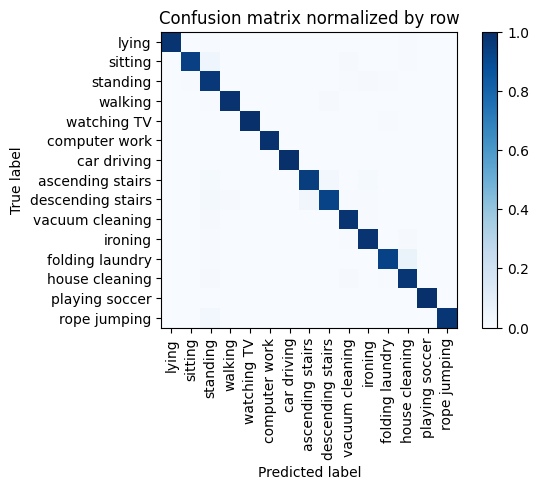

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.989      0.992      0.149        660|	 standing: 0.003,	lying: 0.003,	
          walking       0.996      0.985      0.990      0.108        475|	 descending stairs: 0.011,	standing: 0.004,	
          ironing       0.977      0.981      0.979      0.106        470|	 house cleaning: 0.009,	standing: 0.006,	
         standing       0.906      0.967      0.936      0.089        391|	 ironing: 0.010,	vacuum cleaning: 0.008,	
   house cleaning       0.938      0.975      0.956      0.081        357|	 vacuum cleaning: 0.011,	standing: 0.008,	
            lying       0.994      0.983      0.988      0.079        348|	 house cleaning: 0.006,	standing: 0.006,	
  vacuum cleaning       0.963      0.983      0.973      0.078        346|	 standing: 0.009,	ironing: 0.006,	
          sitting       0.991      0.935      0.962      0.076        337|	

unseen: 100%|██████████| 68/68 [00:03<00:00, 19.20batch/s, loss=123]


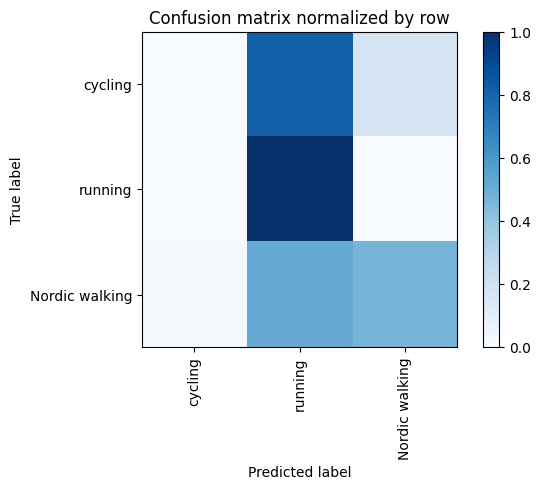

Overall accuracy: 0.415

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.752      0.472      0.580      0.419       1822|	 running: 0.515,	cycling: 0.013,	
       cycling       0.172      0.003      0.006      0.365       1589|	 running: 0.818,	Nordic walking: 0.179,	
       running       0.296      1.000      0.457      0.216        941|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.442      0.415      0.344        1.0       4352|	      

{'accuracy': 0.4149816176470588, 'precision': 0.4067223592936515, 'recall': 0.49171847155376897, 'f1': 0.3476273943279568}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'c

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 283/283 [00:31<00:00,  8.93batch/s, loss=107, accuracy=0.797]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.86batch/s, loss=110]


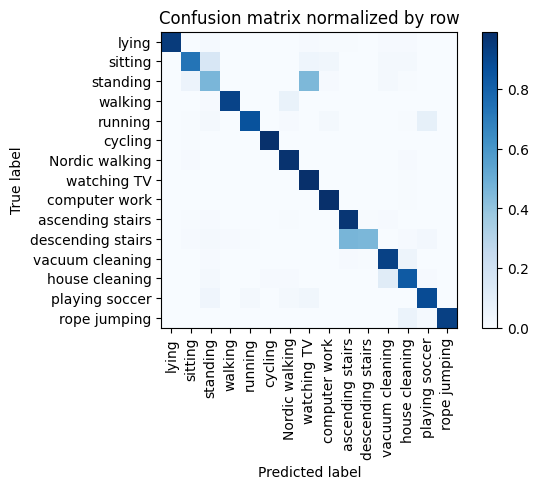

Training Epoch:   7%|▋         | 1/15 [00:35<08:20, 35.75s/it]

Overall accuracy: 0.867

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.966      0.991      0.978      0.143        640|	 house cleaning: 0.005,	vacuum cleaning: 0.003,	
          walking       0.990      0.917      0.952      0.100        447|	 Nordic walking: 0.067,	standing: 0.009,	
   house cleaning       0.871      0.834      0.852      0.085        380|	 vacuum cleaning: 0.113,	standing: 0.018,	
            lying       1.000      0.950      0.974      0.084        377|	 standing: 0.013,	house cleaning: 0.011,	
   Nordic walking       0.899      0.978      0.937      0.081        363|	 house cleaning: 0.011,	sitting: 0.008,	
  vacuum cleaning       0.833      0.925      0.877      0.077        346|	 house cleaning: 0.049,	ascending stairs: 0.009,	
         standing       0.652      0.460      0.539      0.077        346|	 watching TV: 0.451,	sitting: 0.055,	
          sitting       0.897      0.730      0.805 


train: 100%|██████████| 283/283 [00:31<00:00,  8.87batch/s, loss=107, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.64batch/s, loss=106]


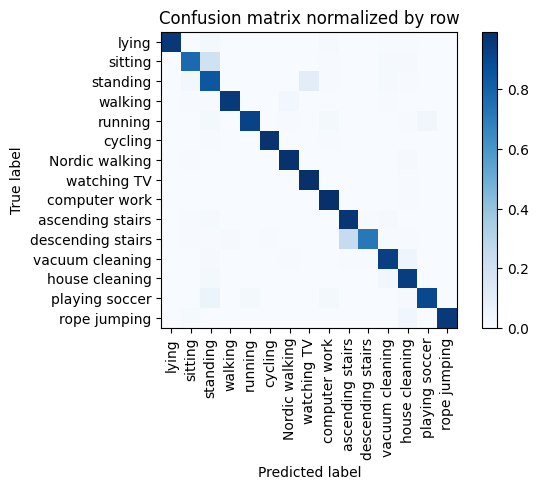

Training Epoch:  13%|█▎        | 2/15 [01:11<07:46, 35.91s/it]

Overall accuracy: 0.929

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.977      0.992      0.985      0.143        641|	 house cleaning: 0.006,	standing: 0.002,	
          walking       0.993      0.957      0.975      0.100        446|	 Nordic walking: 0.025,	standing: 0.007,	
   house cleaning       0.910      0.943      0.926      0.086        385|	 vacuum cleaning: 0.029,	standing: 0.018,	
            lying       1.000      0.960      0.980      0.084        377|	 standing: 0.019,	computer work: 0.011,	
   Nordic walking       0.961      0.983      0.972      0.079        355|	 house cleaning: 0.008,	sitting: 0.006,	
          sitting       0.937      0.772      0.847      0.077        347|	 standing: 0.196,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.915      0.931      0.923      0.077        346|	 house cleaning: 0.043,	standing: 0.009,	
         standing       0.737      0.846      0.788      0.077 


train: 100%|██████████| 283/283 [00:32<00:00,  8.79batch/s, loss=106, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.10batch/s, loss=105]


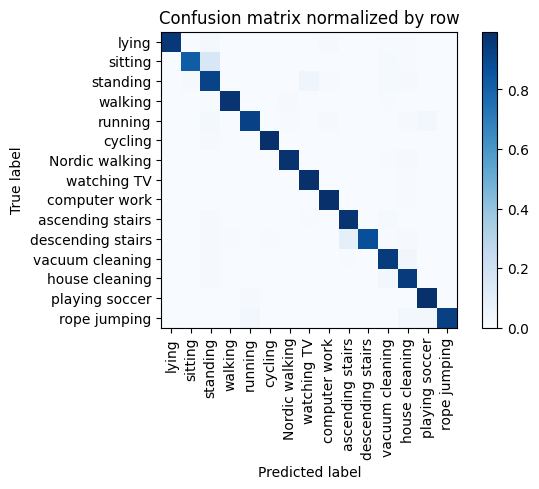

Training Epoch:  20%|██        | 3/15 [01:49<07:18, 36.54s/it]

Overall accuracy: 0.951

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.994      0.991      0.143        640|	 house cleaning: 0.005,	standing: 0.002,	
          walking       0.998      0.973      0.985      0.100        447|	 Nordic walking: 0.009,	vacuum cleaning: 0.007,	
   house cleaning       0.920      0.948      0.934      0.086        386|	 vacuum cleaning: 0.028,	standing: 0.010,	
            lying       1.000      0.960      0.980      0.084        375|	 standing: 0.021,	computer work: 0.008,	
   Nordic walking       0.983      0.981      0.982      0.080        360|	 house cleaning: 0.008,	vacuum cleaning: 0.006,	
         standing       0.792      0.919      0.851      0.077        347|	 watching TV: 0.040,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.908      0.947      0.927      0.076        342|	 house cleaning: 0.032,	standing: 0.009,	
          sitting       0.983      0.822     


train: 100%|██████████| 283/283 [00:34<00:00,  8.31batch/s, loss=109, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 19.39batch/s, loss=108]


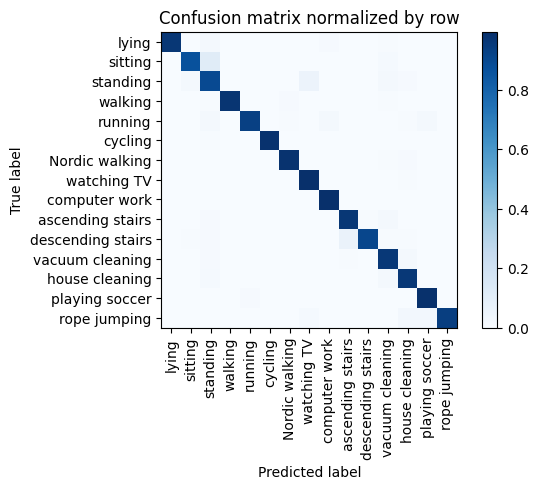

Training Epoch:  27%|██▋       | 4/15 [02:27<06:48, 37.15s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.995      0.992      0.143        642|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.973      0.986      0.100        446|	 Nordic walking: 0.009,	vacuum cleaning: 0.007,	
   house cleaning       0.947      0.961      0.954      0.087        388|	 vacuum cleaning: 0.018,	standing: 0.015,	
            lying       1.000      0.965      0.982      0.083        373|	 standing: 0.019,	computer work: 0.008,	
   Nordic walking       0.983      0.983      0.983      0.081        361|	 house cleaning: 0.008,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.915      0.962      0.938      0.077        346|	 house cleaning: 0.020,	standing: 0.009,	
         standing       0.817      0.898      0.856      0.077        343|	 watching TV: 0.055,	vacuum cleaning: 0.017,	
          sitting       0.971      0.868     


train: 100%|██████████| 283/283 [00:32<00:00,  8.66batch/s, loss=107, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.73batch/s, loss=110]


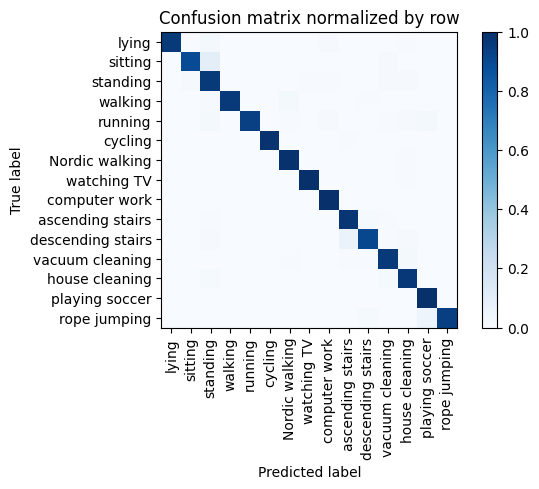

Training Epoch:  33%|███▎      | 5/15 [03:03<06:10, 37.01s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.995      0.991      0.142        637|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.964      0.982      0.100        447|	 Nordic walking: 0.018,	standing: 0.009,	
   house cleaning       0.946      0.966      0.956      0.085        382|	 vacuum cleaning: 0.013,	standing: 0.013,	
            lying       1.000      0.962      0.981      0.083        373|	 standing: 0.019,	computer work: 0.011,	
   Nordic walking       0.970      0.989      0.979      0.081        361|	 house cleaning: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.951      0.960      0.956      0.077        347|	 house cleaning: 0.017,	descending stairs: 0.006,	
         standing       0.851      0.960      0.902      0.077        346|	 sitting: 0.012,	house cleaning: 0.009,	
          sitting       0.977      0.891      0.9


train: 100%|██████████| 283/283 [00:31<00:00,  8.88batch/s, loss=105, accuracy=0.859]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.48batch/s, loss=102]


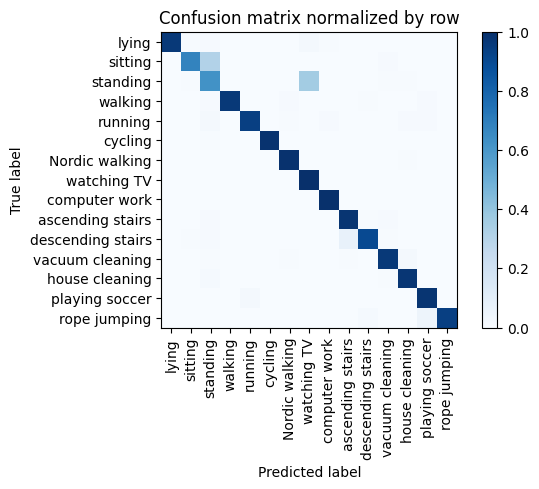

Training Epoch:  40%|████      | 6/15 [03:39<05:30, 36.68s/it]

Overall accuracy: 0.923

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.995      0.993      0.142        638|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.964      0.982      0.100        447|	 Nordic walking: 0.011,	playing soccer: 0.009,	
   house cleaning       0.959      0.974      0.966      0.086        385|	 standing: 0.016,	vacuum cleaning: 0.005,	
            lying       1.000      0.963      0.981      0.083        374|	 watching TV: 0.016,	standing: 0.008,	
   Nordic walking       0.978      0.992      0.985      0.080        360|	 house cleaning: 0.006,	vacuum cleaning: 0.003,	
         standing       0.618      0.621      0.620      0.077        346|	 watching TV: 0.358,	house cleaning: 0.006,	
          sitting       0.979      0.676      0.800      0.077        346|	 standing: 0.309,	vacuum cleaning: 0.012,	
  vacuum cleaning       0.962      0.962      0.


train: 100%|██████████| 283/283 [00:31<00:00,  8.91batch/s, loss=104, accuracy=0.875]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.72batch/s, loss=106]


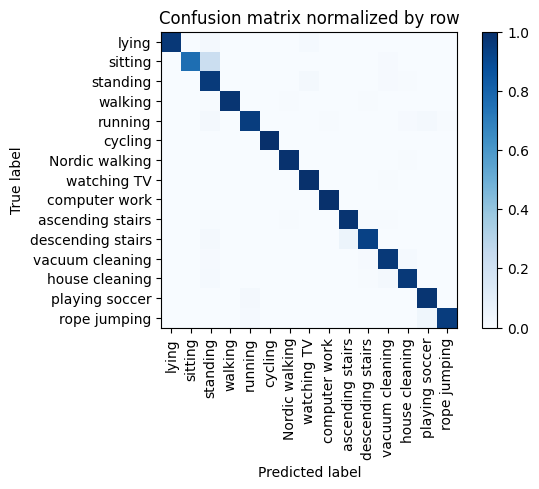

Overall accuracy: 0.958



Training Epoch:  47%|████▋     | 7/15 [04:16<04:52, 36.51s/it]

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.995      0.995      0.142        637|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.980      0.990      0.098        441|	 descending stairs: 0.007,	Nordic walking: 0.005,	
   house cleaning       0.961      0.961      0.961      0.086        385|	 vacuum cleaning: 0.018,	standing: 0.013,	
            lying       1.000      0.966      0.982      0.084        377|	 standing: 0.016,	watching TV: 0.013,	
   Nordic walking       0.989      0.992      0.990      0.081        361|	 house cleaning: 0.006,	vacuum cleaning: 0.003,	
          sitting       0.996      0.760      0.862      0.077        346|	 standing: 0.223,	vacuum cleaning: 0.012,	
  vacuum cleaning       0.946      0.962      0.954      0.077        345|	 house cleaning: 0.014,	descending stairs: 0.012,	
         standing       0.766      0.959      0.852      0.077  


train: 100%|██████████| 283/283 [00:28<00:00,  9.79batch/s, loss=103, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.87batch/s, loss=107]


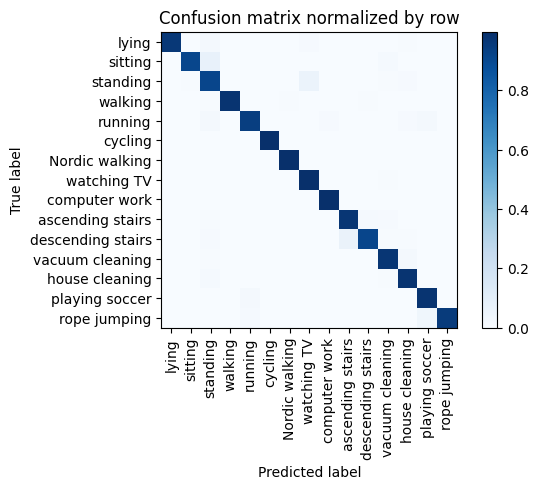

Training Epoch:  53%|█████▎    | 8/15 [04:49<04:07, 35.38s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.995      0.995      0.143        640|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.978      0.989      0.100        448|	 descending stairs: 0.007,	Nordic walking: 0.007,	
   house cleaning       0.952      0.979      0.965      0.086        384|	 standing: 0.013,	vacuum cleaning: 0.005,	
            lying       1.000      0.962      0.981      0.083        371|	 standing: 0.019,	watching TV: 0.011,	
   Nordic walking       0.989      0.994      0.992      0.081        363|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.960      0.971      0.966      0.077        347|	 house cleaning: 0.017,	standing: 0.006,	
         standing       0.861      0.913      0.886      0.077        346|	 watching TV: 0.061,	house cleaning: 0.012,	
          sitting       0.990      0.909      


train: 100%|██████████| 283/283 [00:29<00:00,  9.55batch/s, loss=104, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.78batch/s, loss=105]


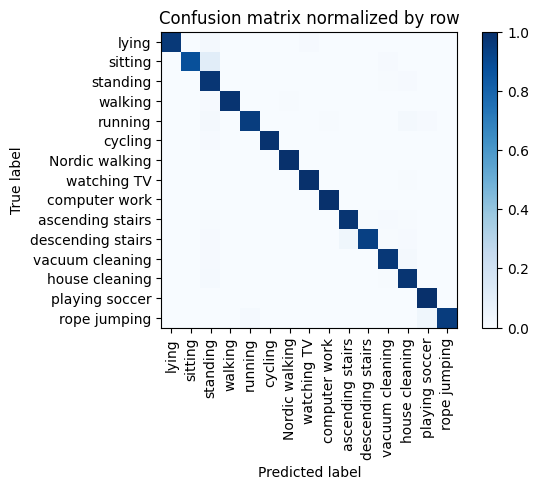

Training Epoch:  60%|██████    | 9/15 [05:22<03:29, 34.86s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.995      0.995      0.144        644|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.982      0.991      0.101        452|	 standing: 0.009,	Nordic walking: 0.004,	
   house cleaning       0.943      0.977      0.959      0.086        386|	 standing: 0.016,	vacuum cleaning: 0.005,	
            lying       1.000      0.962      0.981      0.083        372|	 standing: 0.022,	watching TV: 0.008,	
   Nordic walking       0.992      0.994      0.993      0.080        360|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.959      0.965      0.962      0.077        343|	 house cleaning: 0.023,	standing: 0.009,	
          sitting       0.990      0.877      0.930      0.076        342|	 standing: 0.108,	vacuum cleaning: 0.012,	
         standing       0.828      0.976      0.896      


train: 100%|██████████| 283/283 [00:30<00:00,  9.43batch/s, loss=108, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.44batch/s, loss=105]


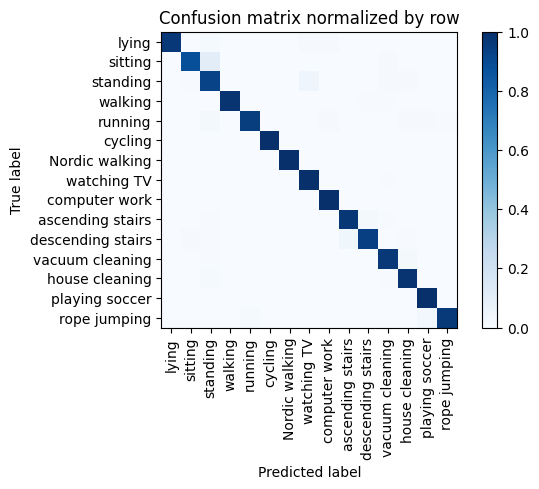

Training Epoch:  67%|██████▋   | 10/15 [05:56<02:53, 34.64s/it]

Overall accuracy: 0.968

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.997      0.994      0.142        638|	 house cleaning: 0.002,	standing: 0.002,	
          walking       0.998      0.982      0.990      0.098        441|	 descending stairs: 0.007,	vacuum cleaning: 0.005,	
   house cleaning       0.957      0.977      0.967      0.086        385|	 standing: 0.016,	vacuum cleaning: 0.005,	
            lying       0.997      0.968      0.982      0.083        374|	 standing: 0.013,	watching TV: 0.011,	
   Nordic walking       0.997      0.994      0.996      0.080        359|	 house cleaning: 0.003,	walking: 0.003,	
         standing       0.855      0.926      0.889      0.078        350|	 watching TV: 0.046,	house cleaning: 0.011,	
  vacuum cleaning       0.963      0.968      0.965      0.077        346|	 house cleaning: 0.023,	standing: 0.006,	
          sitting       0.987      0.881      0.931  


train: 100%|██████████| 283/283 [00:29<00:00,  9.72batch/s, loss=101, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 19.01batch/s, loss=102]


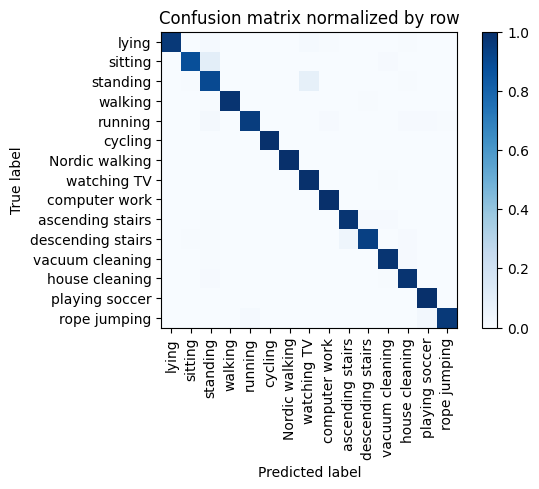

Training Epoch:  73%|███████▎  | 11/15 [06:30<02:16, 34.19s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.997      0.994      0.142        634|	 house cleaning: 0.002,	standing: 0.002,	
          walking       0.998      0.982      0.990      0.100        450|	 descending stairs: 0.007,	standing: 0.007,	
   house cleaning       0.962      0.982      0.972      0.086        387|	 standing: 0.010,	vacuum cleaning: 0.005,	
            lying       1.000      0.963      0.981      0.084        376|	 watching TV: 0.013,	standing: 0.013,	
   Nordic walking       0.997      0.997      0.997      0.080        358|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.990      0.882      0.933      0.077        347|	 standing: 0.101,	vacuum cleaning: 0.012,	
         standing       0.847      0.899      0.872      0.077        346|	 watching TV: 0.084,	house cleaning: 0.006,	
  vacuum cleaning       0.971      0.980      0.975   


train: 100%|██████████| 283/283 [00:29<00:00,  9.59batch/s, loss=103, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.36batch/s, loss=101]


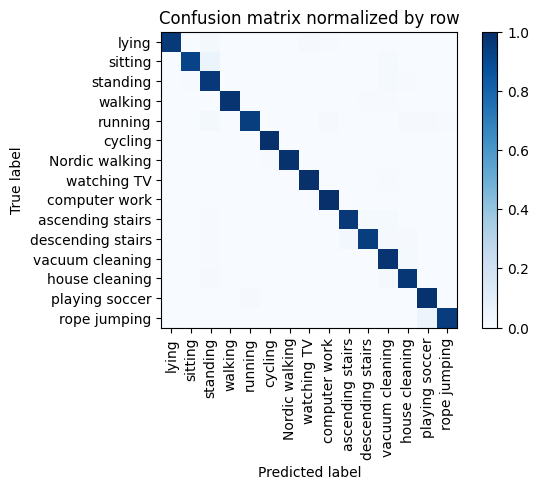

Training Epoch:  80%|████████  | 12/15 [07:03<01:42, 34.03s/it]

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.997      0.995      0.143        641|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.980      0.990      0.100        446|	 vacuum cleaning: 0.007,	descending stairs: 0.004,	
   house cleaning       0.961      0.971      0.966      0.084        378|	 vacuum cleaning: 0.016,	standing: 0.011,	
            lying       1.000      0.963      0.981      0.084        378|	 standing: 0.016,	watching TV: 0.011,	
   Nordic walking       0.997      0.989      0.993      0.081        362|	 cycling: 0.006,	house cleaning: 0.003,	
          sitting       0.988      0.922      0.954      0.078        348|	 standing: 0.060,	vacuum cleaning: 0.014,	
         standing       0.894      0.968      0.929      0.077        347|	 vacuum cleaning: 0.014,	house cleaning: 0.006,	
  vacuum cleaning       0.928      0.977      0.


train: 100%|██████████| 283/283 [00:29<00:00,  9.73batch/s, loss=104, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.73batch/s, loss=104]


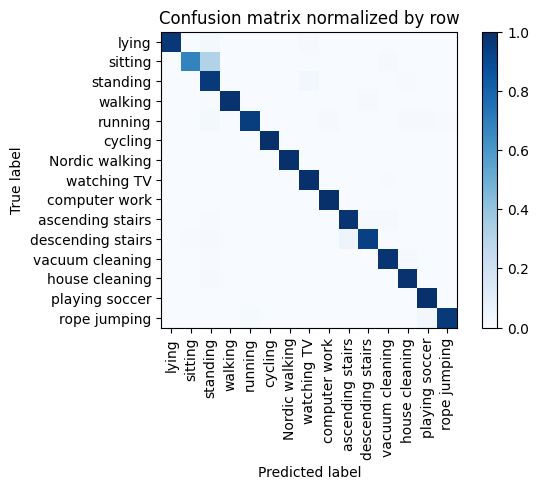

Training Epoch:  87%|████████▋ | 13/15 [07:36<01:07, 33.78s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.997      0.995      0.143        640|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.987      0.993      0.100        447|	 descending stairs: 0.009,	standing: 0.004,	
   house cleaning       0.972      0.987      0.979      0.086        385|	 standing: 0.010,	sitting: 0.003,	
            lying       1.000      0.968      0.984      0.083        372|	 standing: 0.016,	watching TV: 0.011,	
   Nordic walking       1.000      0.994      0.997      0.080        357|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
         standing       0.723      0.960      0.825      0.078        348|	 watching TV: 0.026,	house cleaning: 0.006,	
  vacuum cleaning       0.977      0.983      0.980      0.077        346|	 house cleaning: 0.012,	standing: 0.006,	
          sitting       0.983      0.677      0.802      0.0


train: 100%|██████████| 283/283 [00:30<00:00,  9.36batch/s, loss=106, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.54batch/s, loss=101] 


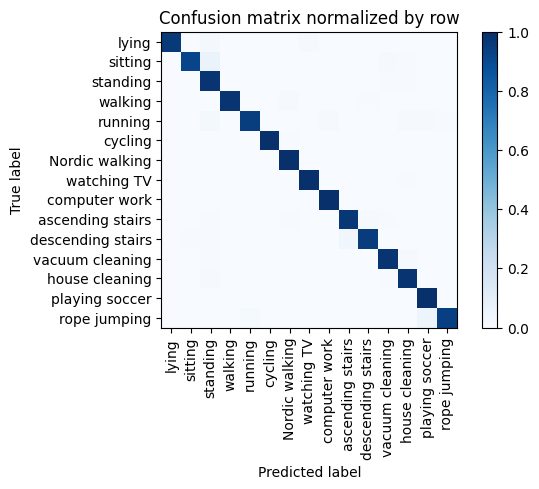

Training Epoch:  93%|█████████▎| 14/15 [08:11<00:33, 33.95s/it]

Overall accuracy: 0.975

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.995      0.995      0.143        640|	 house cleaning: 0.003,	standing: 0.002,	
          walking       1.000      0.980      0.990      0.101        451|	 Nordic walking: 0.009,	descending stairs: 0.007,	
   house cleaning       0.961      0.979      0.970      0.085        379|	 standing: 0.011,	vacuum cleaning: 0.005,	
            lying       1.000      0.962      0.981      0.083        373|	 standing: 0.019,	watching TV: 0.011,	
   Nordic walking       0.981      0.994      0.988      0.081        361|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
         standing       0.890      0.983      0.934      0.077        347|	 house cleaning: 0.006,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.971      0.980      0.975      0.077        345|	 house cleaning: 0.012,	standing: 0.006,	
          sitting       0.988      0.919  


train: 100%|██████████| 283/283 [00:29<00:00,  9.68batch/s, loss=100, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 18.99batch/s, loss=97.3]


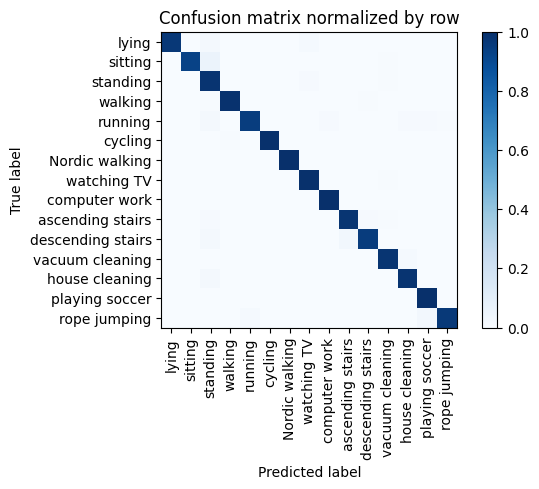

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.997      0.996      0.143        640|	 house cleaning: 0.002,	standing: 0.002,	
          walking       0.993      0.989      0.991      0.100        449|	 descending stairs: 0.007,	standing: 0.004,	
   house cleaning       0.972      0.984      0.978      0.085        381|	 standing: 0.016,	rope jumping: 0.000,	
            lying       1.000      0.968      0.984      0.084        376|	 standing: 0.016,	watching TV: 0.013,	
   Nordic walking       1.000      0.997      0.999      0.081        361|	 house cleaning: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.983      0.977      0.980      0.077        347|	 house cleaning: 0.014,	walking: 0.003,	
         standing       0.881      0.983      0.929      0.077        346|	 watching TV: 0.009,	vacuum cleaning: 0.006,	
          sitting       0.997      0.927      0.961      0

unseen: 100%|██████████| 60/60 [00:02<00:00, 20.25batch/s, loss=112]


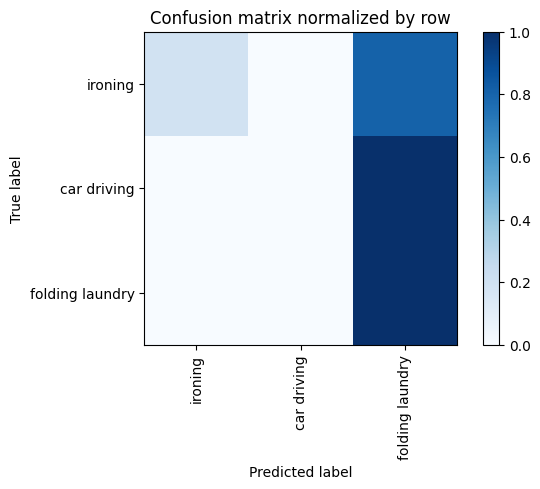

Overall accuracy: 0.370

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.996      0.194      0.324      0.607       2329|	 folding laundry: 0.806,	car driving: 0.000,	
folding laundry       0.287      0.998      0.446      0.253        973|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.676      0.370      0.310        1.0       3840|	      

{'accuracy': 0.3703125, 'precision': 0.427451345995957, 'recall': 0.39719661429661396, 'f1': 0.2565807336922207}
============== Overall Unseen Classes Performance ==============


accuracy     0.517400
precision    0.548795
recall       0.583888
f1           0.485555
dtype: float64

In [73]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
